# Init

In [1]:
!nvidia-smi

Mon May  9 08:32:43 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8    27W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install wandb

     |████████████████████████████████| 1.8 MB 5.0 MB/s 
     |████████████████████████████████| 144 kB 11.0 MB/s 
     |████████████████████████████████| 181 kB 10.7 MB/s 
     |████████████████████████████████| 63 kB 912 kB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=bd022f8690eaefeee7f5d659331ed43985918cc4737ad24e504b82241127cd31
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools


In [4]:
from functools import lru_cache
import matplotlib.pyplot as plt
import numpy as np
import os
import subprocess
import shutil
from copy import deepcopy
import pandas as pd
from glob import glob

import torch
import torchvision.transforms as transforms
from torch import nn
from torch.nn import functional as F

from PIL import Image
from torch.utils.data import Dataset, random_split
import cv2
from torchsummary import summary
import random
import time
from tqdm import tqdm
from collections import defaultdict
from IPython.display import clear_output
import albumentations as A
from albumentations.pytorch import ToTensor

import wandb

In [6]:
# Чтобы использовать wandb, нужно сохранить wandb api_key в файл .wandb_api_key.txt

with open('.wandb_api_key.txt') as f:
    api_key = f.readlines()[0].strip()

wandb.login(key=api_key)
wandb_api = wandb.Api()

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


Копирую свой репозиторий с кодом моделей и несколькими полезными функциями и классами (например, функции для обучения моделей, классы для пост-процессинга и т.д.)

In [8]:
!git clone https://github.com/bumchik2/HumanSegmentation

Cloning into 'HumanSegmentation'...
remote: Enumerating objects: 136, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (83/83), done.
remote: Total 136 (delta 62), reused 117 (delta 49), pack-reused 0
Receiving objects: 100% (136/136), 22.81 MiB | 18.02 MiB/s, done.
Resolving deltas: 100% (62/62), done.


In [9]:
# Добавляем мой репозиторий в sys.path, чтобы можно было оттуда все импортировать

import sys
sys.path.append('HumanSegmentation')

In [10]:
def upload_file_from_gdrive(gdrive_file_id, outfile) -> None:
    """
    Скачивает файл из Google Drive по ID.
    gdrive_file_id -- id файла на гугл-диске.
    outfile -- путь до файла, в котором будет сохранено изображение.
    """
    
    upload_cmd = (
        "wget --load-cookies /tmp/cookies.txt"
        " \"https://docs.google.com/uc?export=download&confirm=$("
        " wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies"
        f" --no-check-certificate 'https://docs.google.com/uc?export=download&id={gdrive_file_id}'"
        f" -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\\1\\n/p')&id={gdrive_file_id}\" "
        f" -O {outfile} && rm -rf /tmp/cookies.txt"
    )
    subprocess.check_call(upload_cmd, shell=True)

In [11]:
zip_path = 'MIL_task_data.zip'
upload_file_from_gdrive('1iXfHPhoA3D2kM_8GfcveKuYSrRYZkqc3', 'MIL_task_data.zip')

In [12]:
data_path = 'MIL_task_data'
!unzip -qq $zip_path -d $data_path

In [13]:
from lib.show import show_img_with_mask
from lib.metrics import get_dice

In [14]:
image_height = 320
image_width = 240

# Look at data

In [77]:
def visualize_several_images(path, n=6, show_mask=True):
  images = os.listdir(path)

  for filename in sorted(os.listdir(path))[:n]:
    ind = int(filename.split('.')[0])
    image = read_image(f"{path}/{ind}.jpg")

    if show_mask:
        mask = read_mask(f"{path}_mask/{ind}.png")
    else:
        mask = np.zeros((image_height, image_width))

    show_img_with_mask(image, mask, figsize=(7, 5))

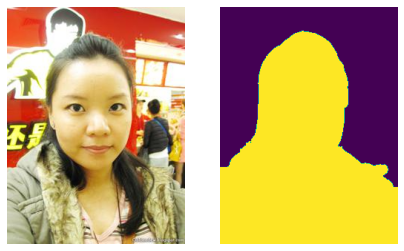

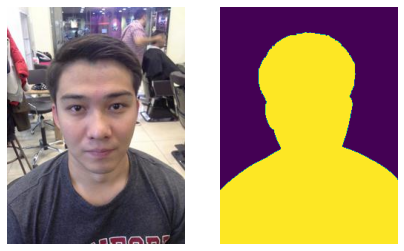

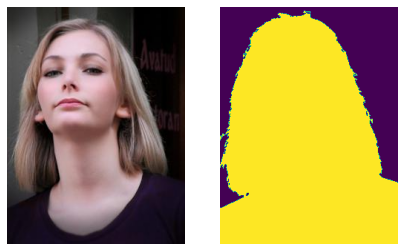

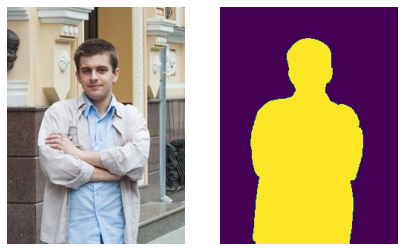

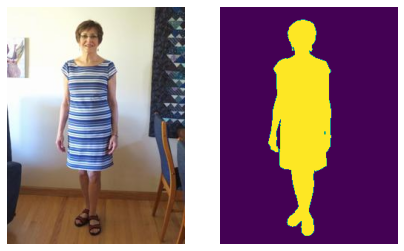

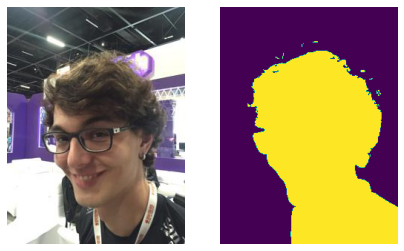

In [78]:
visualize_several_images(os.path.join(data_path, 'data/train'), n=6, show_mask=True)

Проверим, что данные в valid и test имеют примерно такой же вид, что и train - ожидаем увидеть одного человека на картинке, занимающего значительную часть изображения

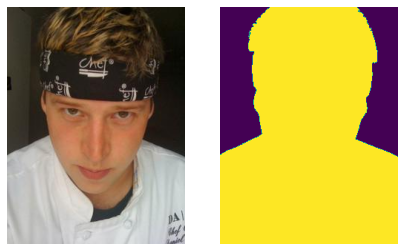

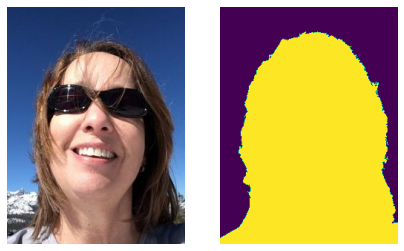

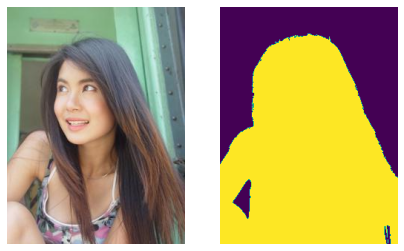

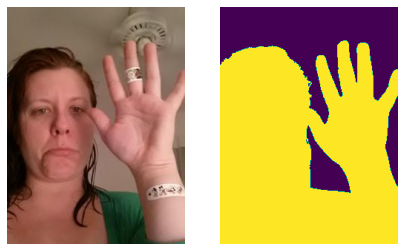

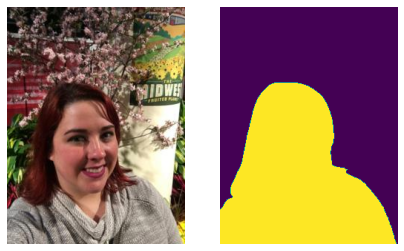

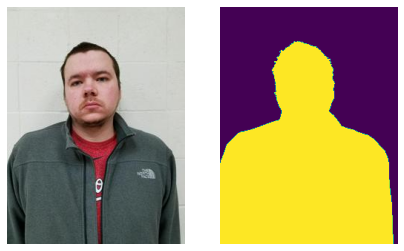

In [79]:
visualize_several_images(os.path.join(data_path, 'data/valid'), n=6, show_mask=True)

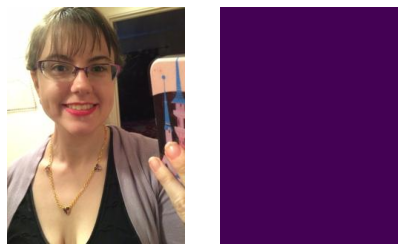

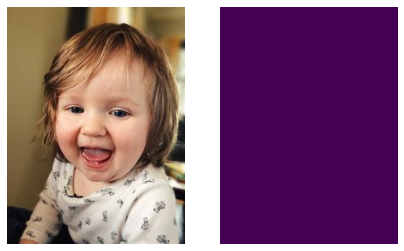

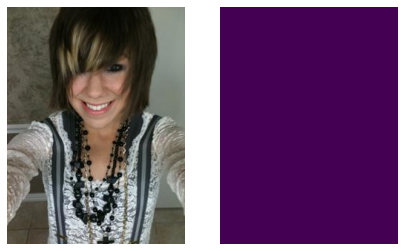

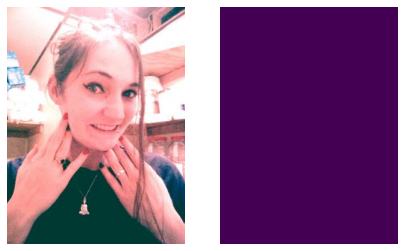

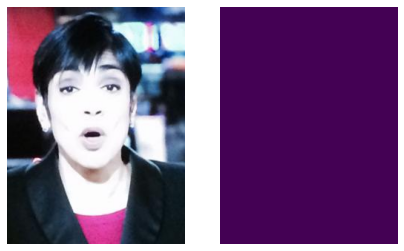

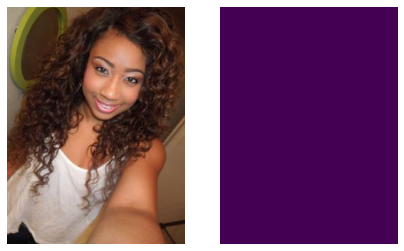

In [80]:
visualize_several_images(os.path.join(data_path, 'data/test'), n=6, show_mask=False)

Не стал визуализировать все картинки в ноутбуке, но я посмотрел на весь valid, test и часть train - везде был изображен один человек и он занимал значительную часть изображения.

In [ ]:
!ls MIL_task_data/data
!ls MIL_task_data/data/train | wc -l
!ls MIL_task_data/data/train_mask | wc -l
!ls MIL_task_data/data/valid | wc -l
!ls MIL_task_data/data/valid_mask | wc -l
!ls MIL_task_data/data/test | wc -l

pred_valid_template.csv  test  train  train_mask  valid  valid_mask
1315
1315
145
145
100


На всякий случай, убедимся, что нас не обманывают и все картинки имеют размер image_height x image_width

In [ ]:
def get_image_sizes(filepath):
    image = cv2.imread(filepath)
    height, width, channels = image.shape
    return height, width, channels


for path_suffix in ('train', 'valid', 'test'):
    path = os.path.join(data_path, 'data', path_suffix)
    for filename in os.listdir(path):
        filepath = os.path.join(path, filename)
        height, width, channels = get_image_sizes(filepath)
        assert(height == image_height and width == image_width and channels == 3)

# Utils

In [16]:
from datasets.segmentation_dataset import SegmentationDataset
from utils.utils import read_image, read_mask
from inference.model_inference import get_mask_prediction, get_metrics
from plots.plot_masks import plot_masks_comparisons
from training.train import train_model

При работе с картинками и масками очень удобно использовать albumentations - https://albumentations.readthedocs.io/en/latest/.

С их помощью можно применять одни и те же преобразования (ресайзы, кропы, флипы и т.д.) к картинкам и маскам одновременно.

In [17]:
# На данном этапе использую самые простые аугментации, такие
# как горизонтальные флипы и небольшие изменения масштабов.
# Resize(image_height, image_width) не будут ничего делать для картинок 
# из имеющихся данных, поскольку они уже имеют правильный размер.

transform_mean_value = (0.485, 0.456, 0.406)
transform_std_value = (0.229, 0.224, 0.225)

train_transform = A.Compose([
    A.Resize(image_height, image_width),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=0, p=0.5),
    A.Normalize(mean=transform_mean_value, std=transform_std_value),
    ToTensor(),
])

val_transform = A.Compose([
    A.Resize(image_height, image_width),
    A.Normalize(mean=transform_mean_value, std=transform_std_value),
    ToTensor()
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((image_height, image_width)),
    transforms.Normalize(mean=transform_mean_value, std=transform_std_value),
])

In [18]:
train_dataset = SegmentationDataset(os.path.join(data_path, 'data/train'), 
                                    os.path.join(data_path, 'data/train_mask'),
                                    train_transform, mode='train')

train_initial_dataset = SegmentationDataset(os.path.join(data_path, 'data/train'), 
                                            os.path.join(data_path, 'data/train_mask'),
                                            val_transform, mode='val')

val_dataset = SegmentationDataset(os.path.join(data_path, 'data/valid'), 
                                  os.path.join(data_path, 'data/valid_mask'),
                                  val_transform, mode='val')

test_dataset = SegmentationDataset(os.path.join(data_path, 'data/test'), 
                                   None,
                                   test_transform, mode='test')

In [19]:
batch_size = 16
train_batch_gen = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=False)
train_initial_batch_gen = torch.utils.data.DataLoader(train_initial_dataset, batch_size=batch_size, shuffle=False, drop_last=False)
val_batch_gen = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False, drop_last=False)
test_batch_gen = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, drop_last=False)

In [20]:
def set_seed(seed=42):
    '''Sets the seed of the entire notebook so results are the same every time we run.
    This is for REPRODUCIBILITY.'''
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # Set a fixed value for the hash seed
    os.environ['PYTHONHASHSEED'] = str(seed)

In [21]:
# Несколько картинок из валидации, которые 
# мы будем прогонять через модель во время обучения

test_images_number = 3
images_paths = []
masks_paths = []
for filename in sorted(os.listdir(os.path.join(data_path, 'data/valid')))[:test_images_number]:
    ind = int(filename.split('.')[0])
    images_paths.append(os.path.join(data_path, 'data/valid', f'{ind}.jpg'))
    masks_paths.append(os.path.join(data_path, 'data/valid_mask', f'{ind}.png'))

for image_path, mask_path in zip(images_paths, masks_paths):
    assert(os.path.exists(image_path))
    assert(os.path.exists(mask_path))

In [22]:
weights_dir = '/content/drive/MyDrive/MILTestTasks/models/'

# Models

In [23]:
from models.vanilla_unet import VanillaUNet
from models.sdunet import SDUNet
from models.linknet import LinkNet
from models.hrnet import HRNet

# Training

**Общее пояснение по процессу обучения:**

Каждая из моделей проходила через один или больше циклов обучения. Последнее число в названии запуска на wandb (например, "1" в "vanilla_unet_1") означает номер цикла обучения для этой модели.

Модели не обучаются с нуля каждый раз: если текущий цикл обучения не первый, в нем будут использоваться полученные ранее веса.

Интересные поля в конфигах:

- augmentations - поясняет, какие аугментации использовались в данном цикле обучения (словесное описание / название использованного transform)
- pretrained_weigths - если присутствует, указывает, какие веса были загружены в начале цикла обучения
- seed - не стоит обращать внимания на это поле; сейчас я забил на reproducibility для ускорения обучения ~ в 2 раза

### Vanilla UNet 

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза


config = {
    'seed': 42,
    'model_name': 'VanillaUNet',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'horizontal flip; slight rescaling',
    'post-processing': 'none',
    'num_epochs': 25,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.95
}

vanilla_unet = VanillaUNet(**config['params']).to(device)

run = 1
name = f'vanilla_unet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(vanilla_unet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 25 of 25 took 183.89 seconds
train loss: 0.14129907948889206
val loss: 0.16998723524397819
train dice: 0.9510009698537005
val dice: 0.9491251968462503


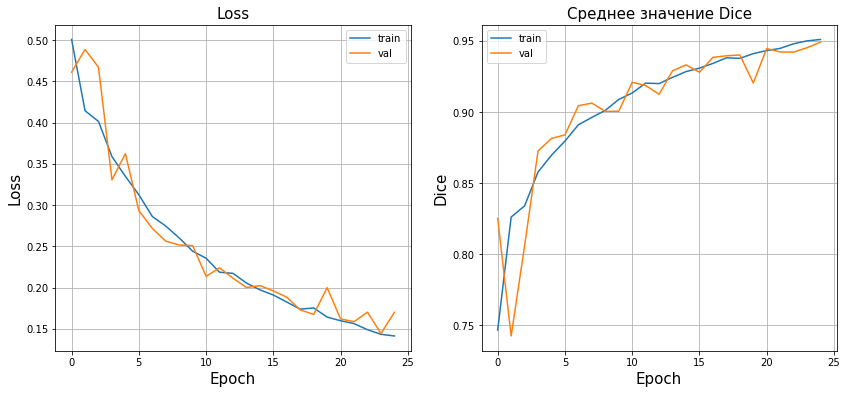

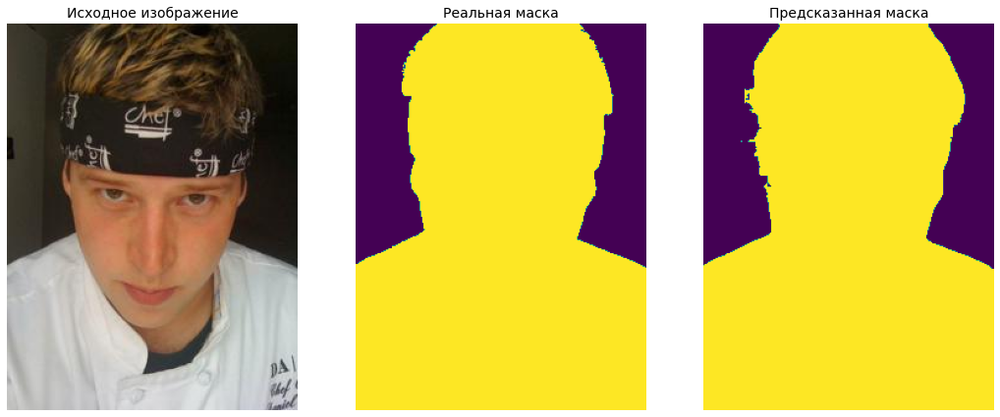

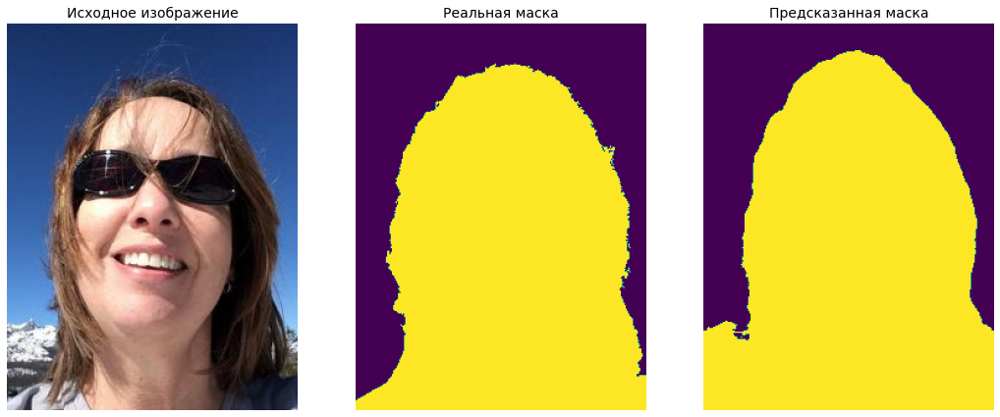

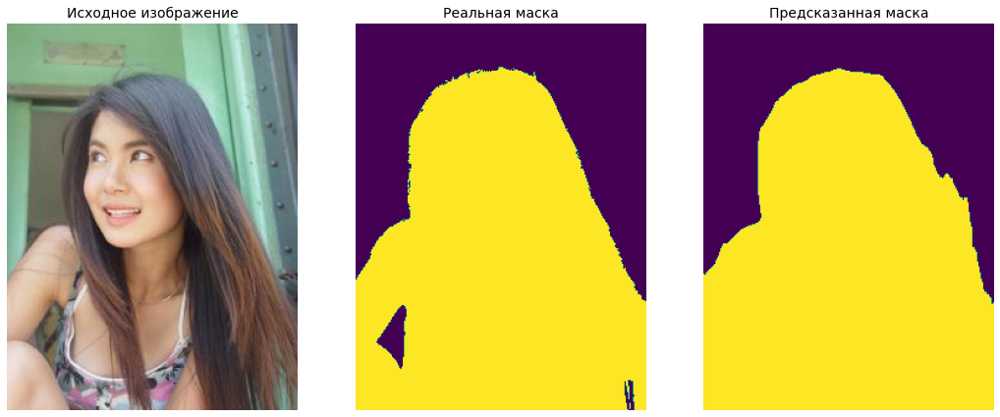

wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=9 sec). Create a new API with an integer timeout larger than 9, e.g., `api = wandb.Api(timeout=19)` to increase the graphql timeout.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=9 sec). Create a new API with an integer timeout larger than 9, e.g., `api = wandb.Api(timeout=19)` to increase the graphql timeout.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=9 sec). Create a new API with an integer timeout larger than 9, e.g., `api = wandb.Api(timeout=19)` to increase the graphql timeout.
100%|██████████| 25/25 [1:18:02<00:00, 187.31s/it]


In [ ]:
vanilla_unet, history = train_model(vanilla_unet, criterion, optimizer, train_batch_gen, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### SDU-Net

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это сильно увеличивает время обучения ~ в 2 раза


config = {
    'seed': 42,
    'model_name': 'SDUNet',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'horizontal flip; slight rescaling',
    'post-processing': 'none',
    'num_epochs': 25,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.95
}

sdunet = SDUNet(**config['params']).to(device)

run = 1
name = f'sdunet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(sdunet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

wandb: Currently logged in as: bumchik2_team (use `wandb login --relogin` to force relogin)


Epoch 25 of 25 took 250.191 seconds
train loss: 0.1162319808291845
val loss: 0.1329919647296955
train dice: 0.9596925012490192
val dice: 0.9514484342977649


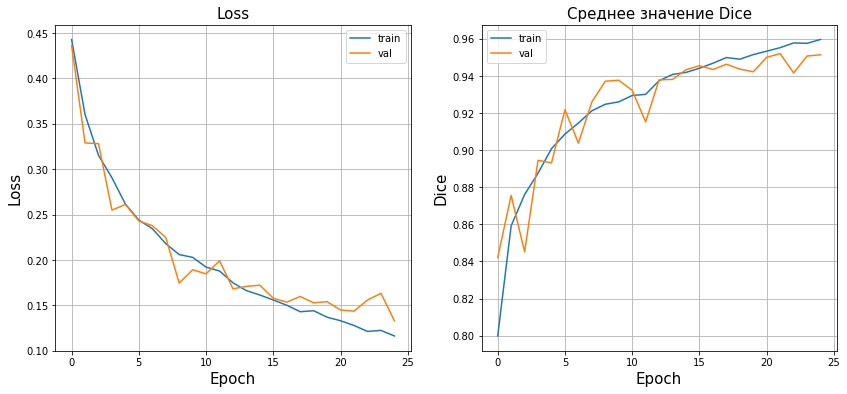

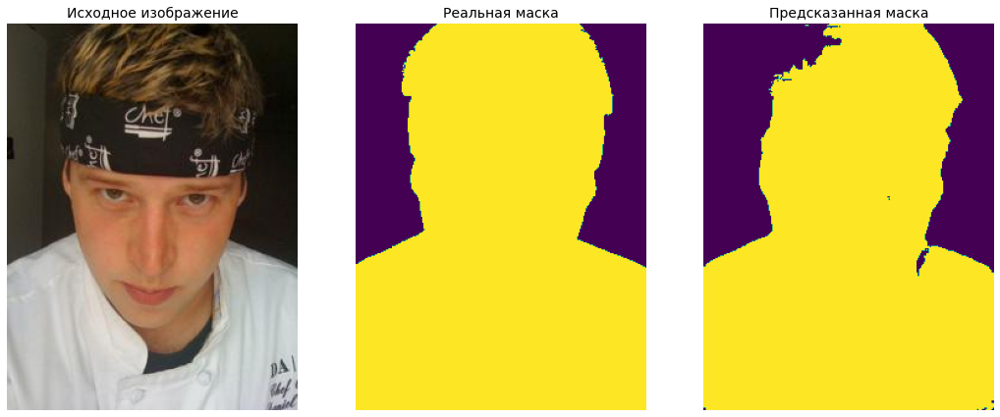

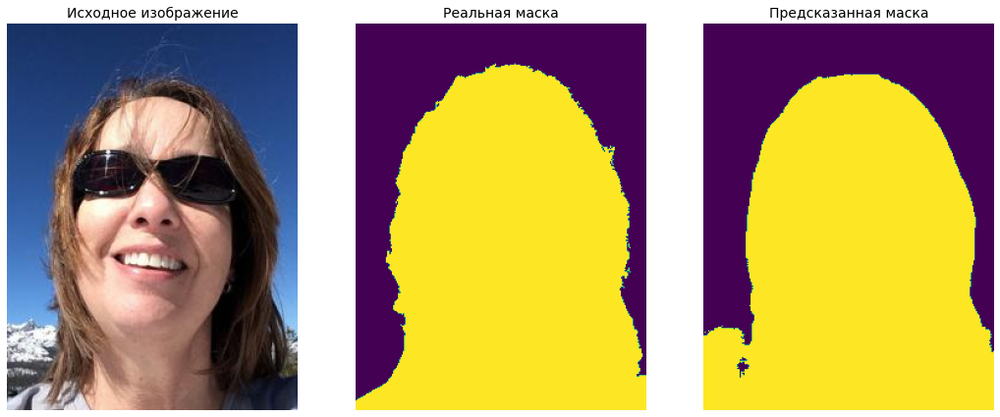

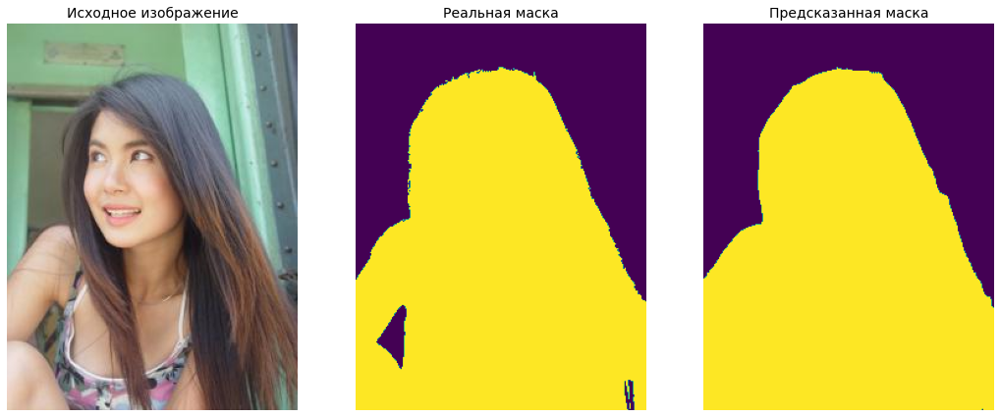

100%|██████████| 25/25 [1:45:27<00:00, 253.09s/it]


In [ ]:
sdunet, history = train_model(sdunet, criterion, optimizer, train_batch_gen, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### Linknet

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это сильно увеличивает время обучения ~ в 2 раза


config = {
    'seed': 42,
    'model_name': 'LinkNet',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'horizontal flip; slight rescaling',
    'post-processing': 'none',
    'num_epochs': 25,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.95
}

linknet = LinkNet(**config['params']).to(device)

run = 1
name = f'linknet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(linknet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 25 of 25 took 111.863 seconds
train loss: 0.2133947299233861
val loss: 0.22655210710805038
train dice: 0.9219342627619211
val dice: 0.9186551666005853


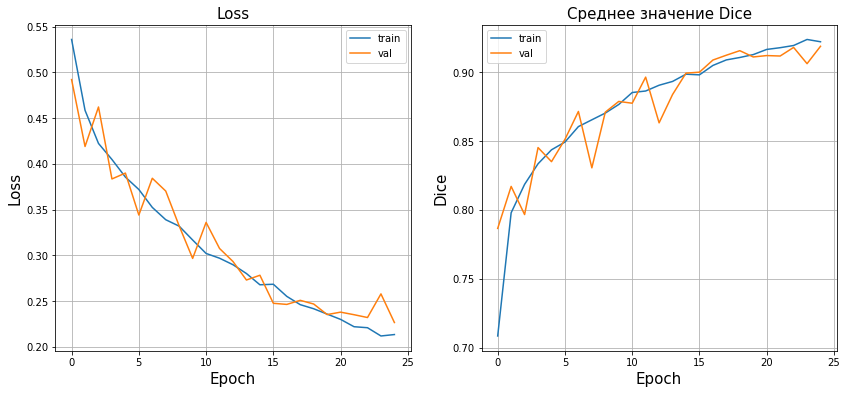

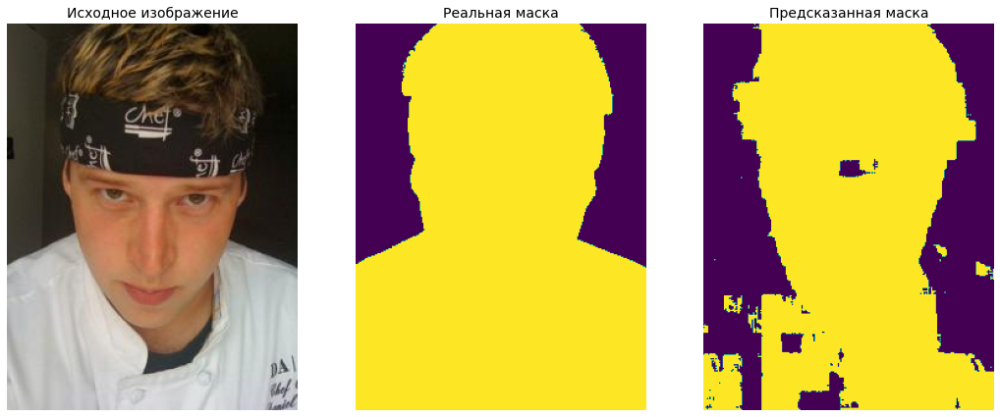

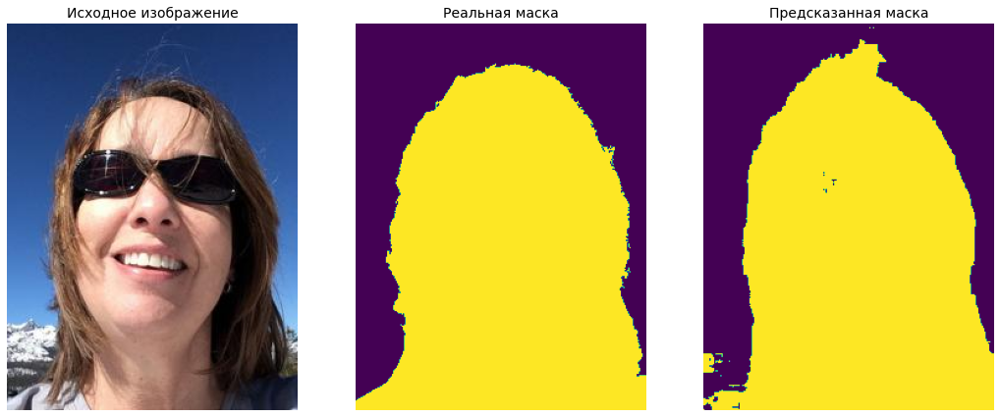

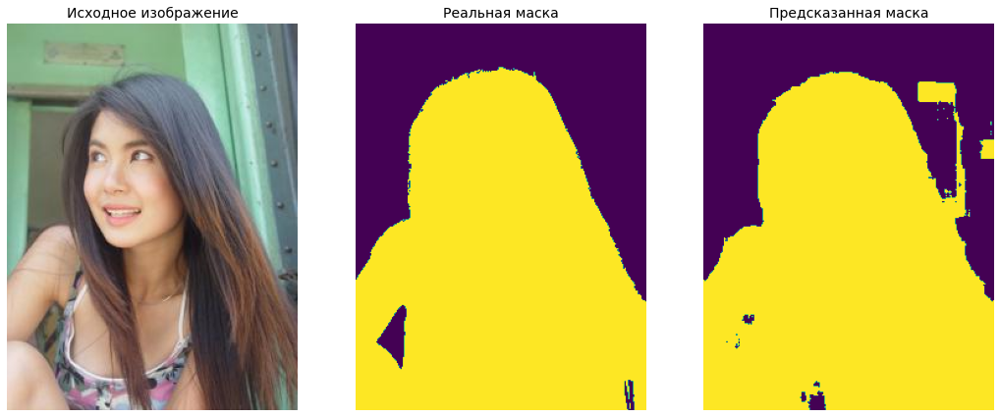

100%|██████████| 25/25 [47:26<00:00, 113.86s/it]


In [ ]:
linknet, history = train_model(linknet, criterion, optimizer, train_batch_gen, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### HRNet

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это сильно увеличивает время обучения ~ в 2 раза


config = {
    'seed': 42,
    'model_name': 'HRNet',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'horizontal flip; slight rescaling',
    'post-processing': 'none',
    'num_epochs': 25,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.95
}

hrnet = HRNet(**config['params']).to(device)

run = 1
name = f'hrnet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(hrnet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

wandb: Currently logged in as: bumchik2_team (use `wandb login --relogin` to force relogin)


Epoch 25 of 25 took 64.622 seconds
train loss: 0.4158794712431077
val loss: 0.42634607409608777
train dice: 0.8782622152762488
val dice: 0.8752654265664511


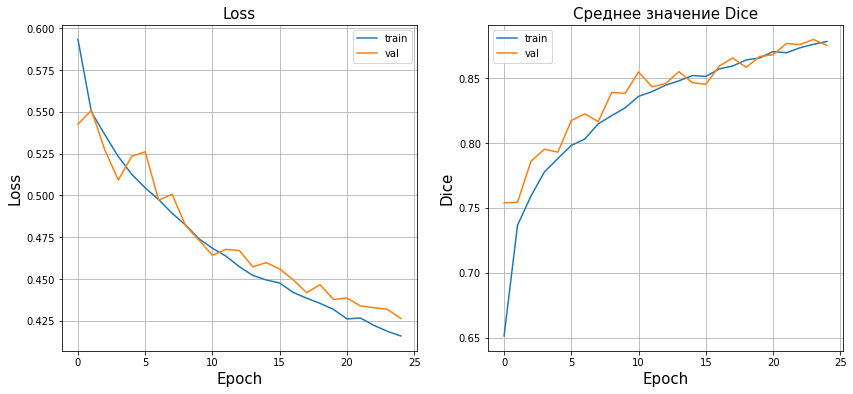

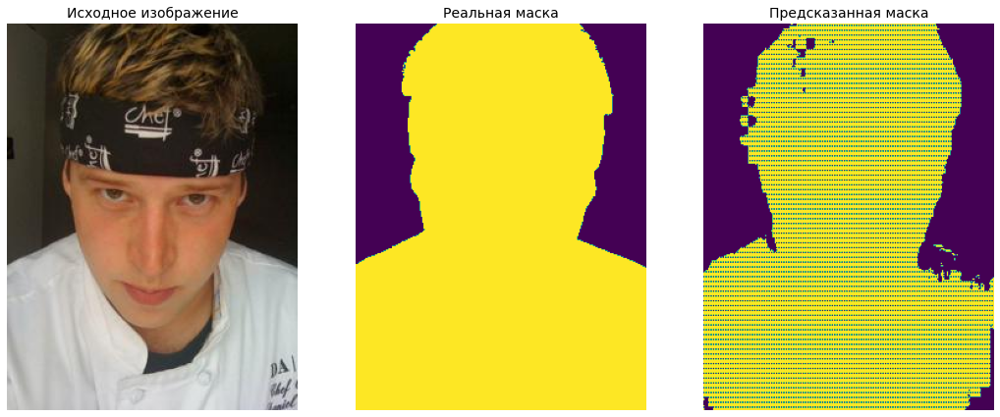

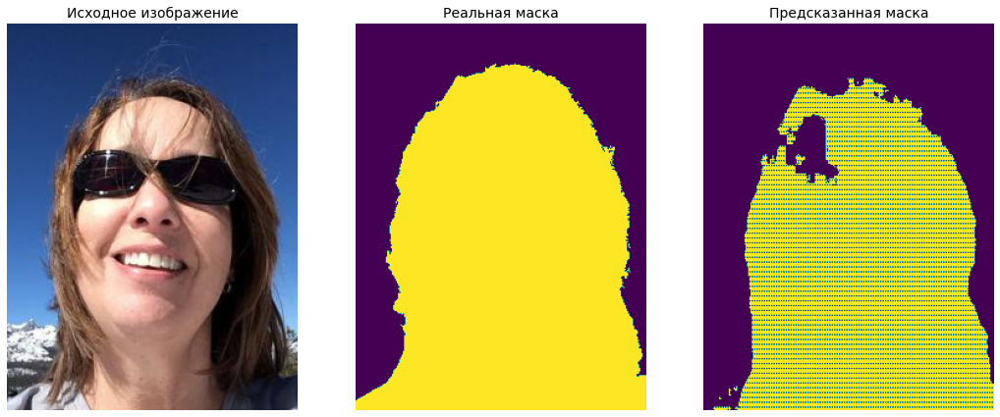

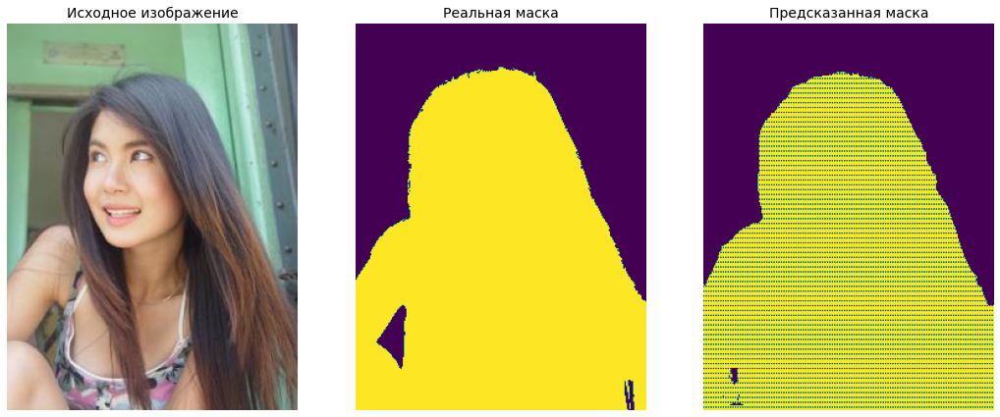

100%|██████████| 25/25 [27:39<00:00, 66.39s/it]


In [ ]:
hrnet, history = train_model(hrnet, criterion, optimizer, train_batch_gen, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

Видно, что за 25 эпох обучения HRNet не успел сойтись: loss на валидации продолжает стремительно убывать, dice растет. Поэтому ставлю эту модель дообучаться еще 50 эпох (начиная с лучшего состояния за первый цикл обучения)

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это сильно увеличивает время обучения ~ в 2 раза


config = {
    'seed': 42,
    'model_name': 'HRNet',
    'pretrained_weights': 'hrnet_1_best.pt',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'horizontal flip; slight rescaling',
    'post-processing': 'none',
    'num_epochs': 50,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.0005,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

hrnet = HRNet(**config['params'])
hrnet.load_state_dict(torch.load(os.path.join('/content/drive/MyDrive/MILTestTasks/models/', config['pretrained_weights'])))
hrnet = hrnet.to(device)

run = 2
name = f'hrnet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(hrnet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 50 of 50 took 64.852 seconds
train loss: 0.32524382467505597
val loss: 0.3617398284632584
train dice: 0.9717254466959139
val dice: 0.959420956876675


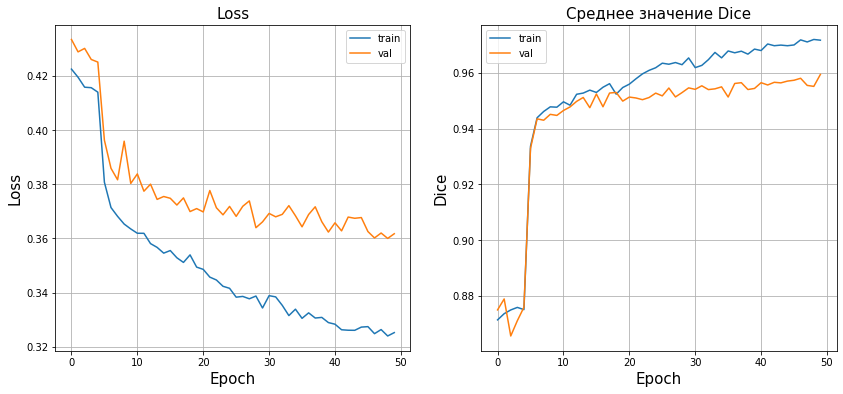

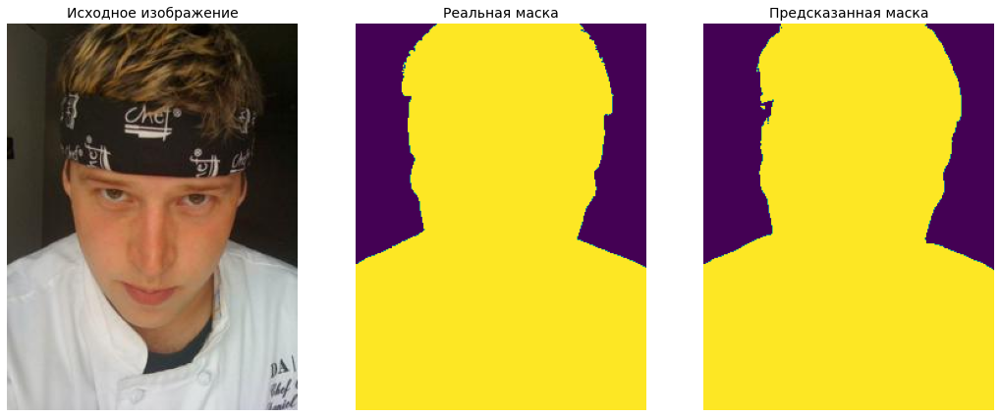

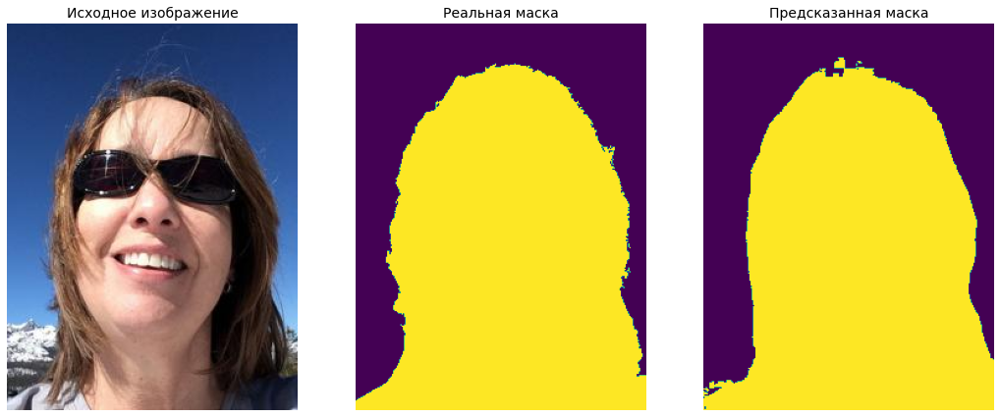

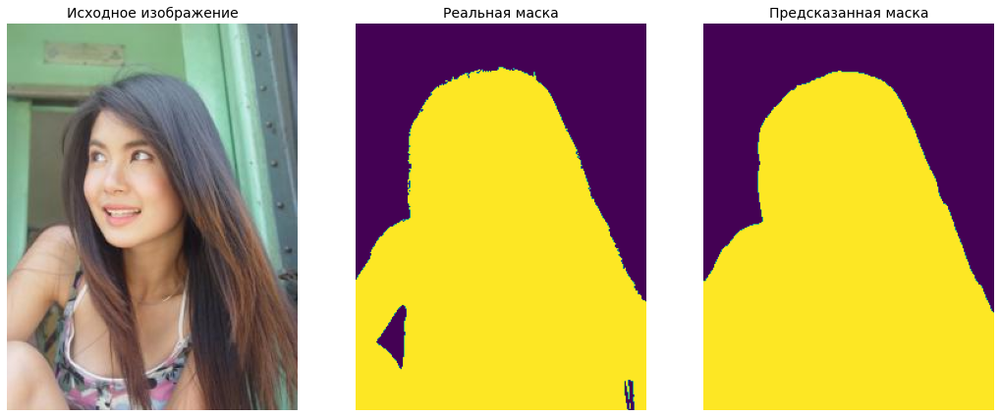

100%|██████████| 50/50 [55:28<00:00, 66.57s/it]


In [ ]:
hrnet, history = train_model(hrnet, criterion, optimizer, train_batch_gen, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

Видим, что модель довольно сильно переобучилась. Стоит попробовать это исправить, например, с помощью различных аугментаций. Возможно, на этапе проектирования модели был смысл добавить dropout слои.

# Metrics so far

In [24]:
model_name_to_class = {
    'VanillaUNet': VanillaUNet,
    'SDUNet': SDUNet,
    'LinkNet': LinkNet,
    'HRNet': HRNet
}


def load_model(run_id, weights_dir, device='cuda'):
    """Loads the best model obtained during specified wandb run.
    Parameters
    ----------
    run_id : str
        wandb run id. 
        The config of the run should contain fields model_name and params for loading model.
    weights_dir : str
        Directory with the weights of trained models.
    device: str, optional (default='cuda')
        Device on which the model will be loaded (cuda or cpu).
    Returns
    -------
    model
        The model with loaded weights on the specified device.
    """
    run = wandb_api.run(f'human_segmentation/{run_id}')
    run_config = run.config
    model_name = run.config.get('model_name')
    run_name = run.name
    model_class = model_name_to_class[model_name]
    model = model_class(**run_config.get('params'))
    weights_path = os.path.join(weights_dir, run_name) + '_best.pt'
    model.load_state_dict(torch.load(weights_path))
    model = model.to(device)
    return model


def get_experiment_info(weights_dir, run_id, criterion, train_batch_gen, 
                        val_batch_gen, device='cuda'):
    """Loads the best model obtained during specified wandb run.
    Parameters
    ----------
    weights_dir : str
        Directory with the weights of trained models.
    run_id : str
        wandb run id. 
        The config of the run should contain fields 'model_name' and 'params' for loading model.
    criterion
        Pytorch criterion for computing loss.
    train_batch_gen
        Data loader for train metrics evaluation.
    val_batch_gen
        Data loader for validation metrics evaluation.
    device : str, optional (default='cuda')
        Device on which the model will be loaded (cuda or cpu).
    Returns
    -------
    model
        Dict with experiment information. The keys of the dict are:
        run_id, run_name, model_name, pretrained_weights, 
        num_epochs, val_loss, val_dice, train_loss, train_dice
    """
    run = wandb_api.run(f'human_segmentation/{run_id}')
    run_config = run.config
    model_name = run.config.get('model_name')
    run_name = run.name

    pretrained_weights = run_config.get('pretrained_weights')
    num_epochs = int(run_config.get('num_epochs'))

    model = load_model(run_id, weights_dir, device)

    val_metrics = get_metrics(model, criterion, val_batch_gen)
    train_metrics = get_metrics(model, criterion, train_batch_gen)
        
    experiment_info = {
        'run_id': run_id,
        'run_name': run_name, 
        'model_name': model_name,
        'pretrained_weights': pretrained_weights,
        'num_epochs': num_epochs,
        'val_loss': round(val_metrics['loss'], 5), 
        'val_dice': round(val_metrics['dice'], 5),
        'train_loss': round(train_metrics['loss'], 5), 
        'train_dice': round(train_metrics['dice'], 5)
    }
    return experiment_info

  
def get_experiments_df(weights_dir, run_ids, criterion, train_batch_gen, 
                       val_batch_gen, experiments_df=None, device='cuda'):
    """Loads the best model obtained during specified wandb run.
    Parameters
    ----------
    weights_dir
        Directory with the weights of trained models.
    run_ids
        wandb run ids. 
        The config of each run should contain fields 'model_name' and 'params' for loading model.
    criterion
        Pytorch criterion for computing loss.
    train_batch_gen
        Data loader for train metrics evaluation.
    val_batch_gen
        Data loader for validation metrics evaluation.
    experiments_df : pd.DataFrame or None
        If not None, concatenate information about new experiments to the passed experiments_df.
    device : str, optional (default='cuda')
        Device on which the model will be loaded (cuda or cpu).
    Returns
    -------
    pd.DataFrame
        pandas Dataframe with the experiments information. The columns of the datafame are:
        run_id, run_name, model_name, pretrained_weights, 
        num_epochs, val_loss, val_dice, train_loss, train_dice
    """
    if experiments_df is None:
        experiments_df = pd.DataFrame(columns=['run_id', 'run_name', 'model_name', 
                                               'pretrained_weights', 'num_epochs', 'val_loss', 
                                               'val_dice', 'train_loss', 'train_dice'])

    for run_id in run_ids:
        experiment_info = get_experiment_info(weights_dir, run_id, criterion,
                                              train_initial_batch_gen, val_batch_gen)
        experiments_df = experiments_df.append(experiment_info, ignore_index=True)

    return experiments_df

In [ ]:
run_ids = ['3i4uqxlh', '2kzf0p5b', '2dz6j77q', 'ep6g98jx', '35wog0h3']

In [ ]:
%%time
criterion = nn.BCEWithLogitsLoss().to(device)
experiments_df = get_experiments_df(weights_dir, run_ids, criterion, 
                                    train_initial_batch_gen, val_batch_gen)

CPU times: user 5min 42s, sys: 1.16 s, total: 5min 44s
Wall time: 5min 46s


In [ ]:
experiments_df

,run_id,run_name,model_name,pretrained_weights,num_epochs,val_loss,val_dice,train_loss,train_dice
0,3i4uqxlh,vanilla_unet_1,VanillaUNet,None,25,0.16999,0.94913,0.13602,0.96174
1,2kzf0p5b,sdunet_1,SDUNet,None,25,0.14365,0.95207,0.10383,0.96804
2,2dz6j77q,linknet_1,LinkNet,None,25,0.22655,0.91866,0.19992,0.93044
3,ep6g98jx,hrnet_1,HRNet,None,25,0.43186,0.87979,0.41063,0.88871
4,35wog0h3,hrnet_2,HRNet,hrnet_1_best.pt,50,0.36174,0.95942,0.31496,0.97897


# Augmentations

In [25]:
augmentations1_list = [
    A.Resize(image_height, image_width),
    A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=30, p=0.5),
    A.RGBShift(r_shift_limit=25, g_shift_limit=25, b_shift_limit=25, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.15, p=0.5),
    A.OneOf([
        A.Blur(blur_limit=7),
        A.GaussNoise(var_limit=(10.0, 50.0)),
    ], p=0.7),
    A.OpticalDistortion(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=transform_mean_value, std=transform_std_value),
    ToTensor(),
]

augmentations_transform_1 = A.Compose(augmentations1_list)

In [ ]:
train_augmented_dataset_1 = SegmentationDataset(os.path.join(data_path, 'data/train'), 
                                                os.path.join(data_path, 'data/train_mask'),
                                                augmentations_transform_1, mode='train')

In [ ]:
train_augmented_batch_gen_1 = torch.utils.data.DataLoader(train_augmented_dataset_1, batch_size=batch_size, shuffle=True, drop_last=False)

Визуализируем несколько из наших аугментированных изображений

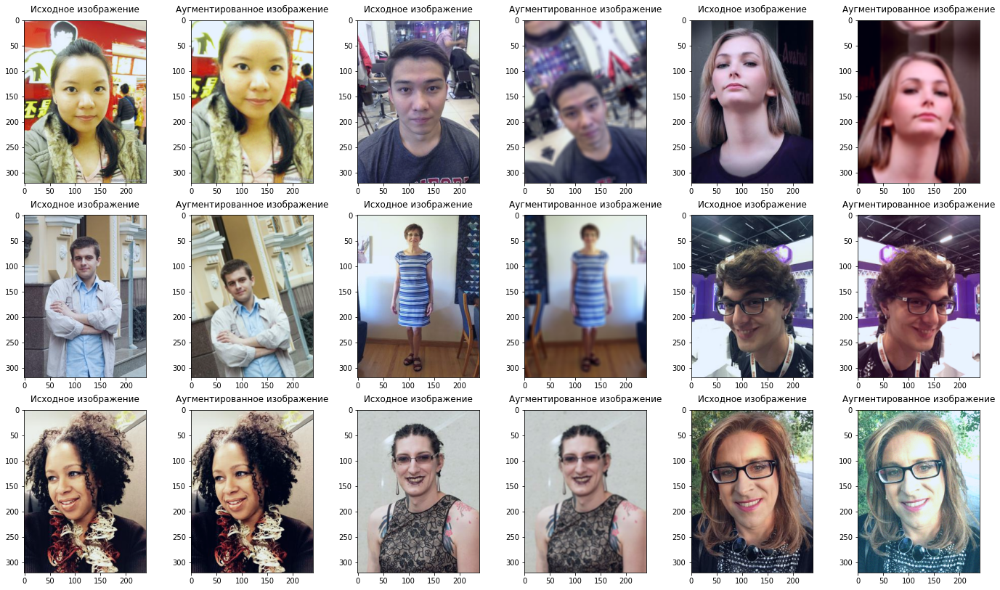

In [ ]:
fig, axes = plt.subplots(3, 6, figsize=(24, 14))


def normalize_image(image):
    image_max = image.max()
    image_min = image.min()
    image = ((image - image_min) / (image_max - image_min) * 255).astype(np.uint8)
    return image


for i in range(3):
    for j in range(3):
        image_index = i * 3 + j

        ax1 = axes[i][j * 2]
        image_initial = np.array(train_initial_dataset[image_index][0].permute(1, 2, 0))
        # нормализуем изображение для визуализации
        image_initial = normalize_image(image_initial)
        ax1.set_title('Исходное изображение', y=1.02)
        ax1.imshow(image_initial)

        ax2 = axes[i][j * 2 + 1]
        image_augmented = np.array(train_augmented_dataset_1[image_index][0].permute(1, 2, 0))
        # нормализуем изображение для визуализации
        image_augmented = normalize_image(image_augmented)
        ax2.set_title('Аугментированное изображение', y=1.02)
        ax2.imshow(image_augmented)


# Training with augmentations1

### Vanilla Unet + augmentations1

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'VanillaUNet',
    'pretrained_weights': 'vanilla_unet_1_best.pt',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'see augmentations_transform_1',
    'post-processing': 'none',
    'num_epochs': 25,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.0005,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

vanilla_unet = VanillaUNet(**config['params'])
vanilla_unet.load_state_dict(torch.load(os.path.join('/content/drive/MyDrive/MILTestTasks/models/', config['pretrained_weights'])))
vanilla_unet = vanilla_unet.to(device)

run = 2
name = f'vanilla_unet_augmentations1_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(vanilla_unet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 25 of 25 took 281.716 seconds
train loss: 0.1515748768478292
val loss: 0.11870122733044214
train dice: 0.9456259719955142
val dice: 0.9572281728154006


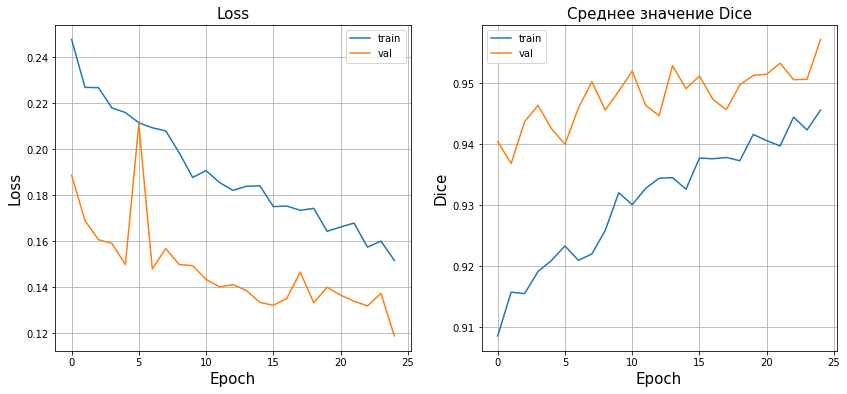

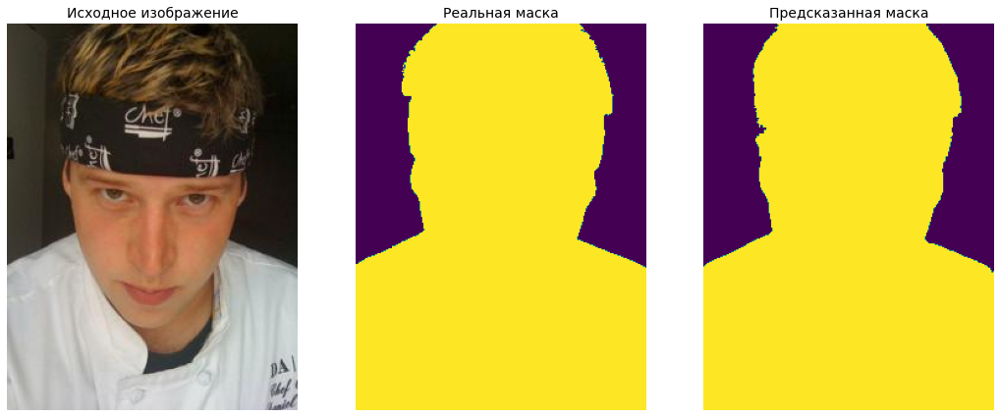

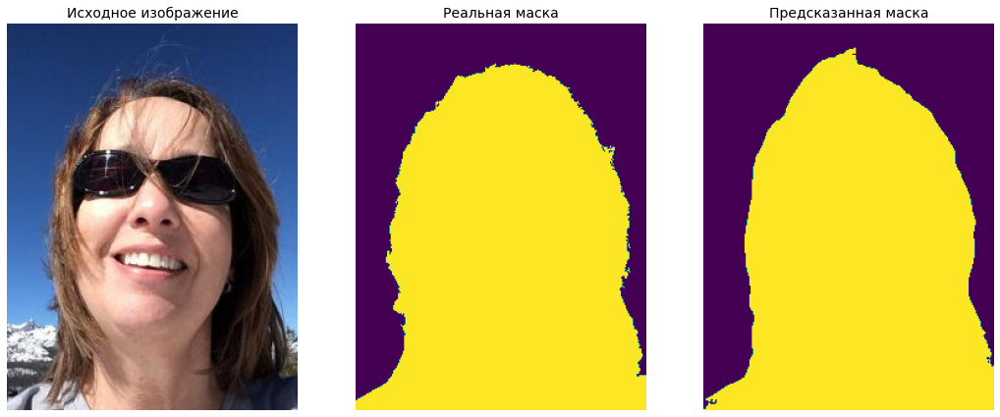

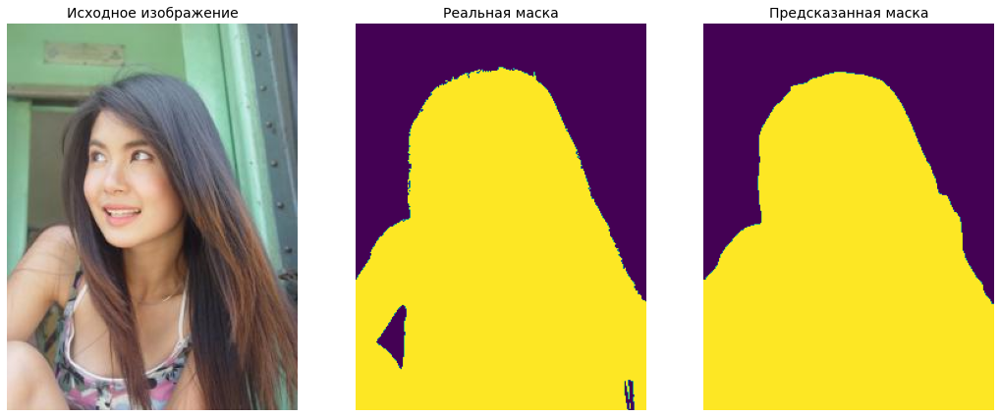

100%|██████████| 25/25 [2:00:01<00:00, 288.07s/it]


In [ ]:
vanilla_unet, history = train_model(vanilla_unet, criterion, optimizer, train_augmented_batch_gen_1, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### SDU-Net + augmentations1 

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'SDUNet',
    'pretrained_weights': 'sdunet_1_best.pt',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'see augmentations_transform_1',
    'post-processing': 'none',
    'num_epochs': 25,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.0005,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

sdunet = SDUNet(**config['params'])
sdunet.load_state_dict(torch.load(os.path.join('/content/drive/MyDrive/MILTestTasks/models/', config['pretrained_weights'])))
sdunet = sdunet.to(device)

run = 2
name = f'sdunet_augmentations1_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(sdunet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

wandb: Currently logged in as: bumchik2 (bumchik2_team). Use `wandb login --relogin` to force relogin


Epoch 25 of 25 took 275.154 seconds
train loss: 0.1486868182005991
val loss: 0.142706136855072
train dice: 0.9475526556696815
val dice: 0.9530877217745968


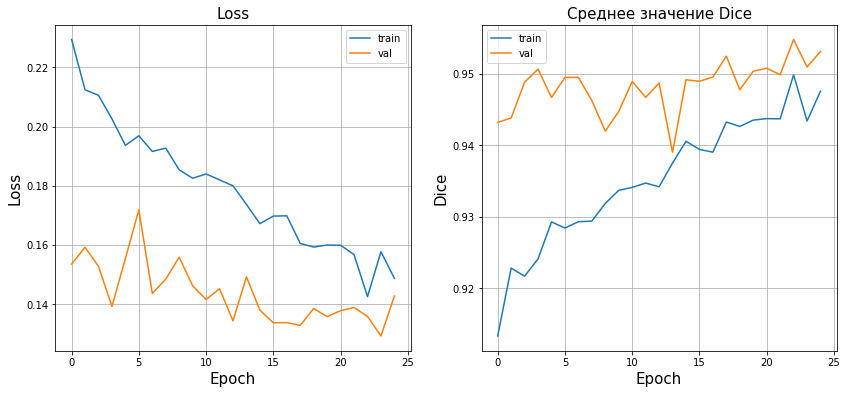

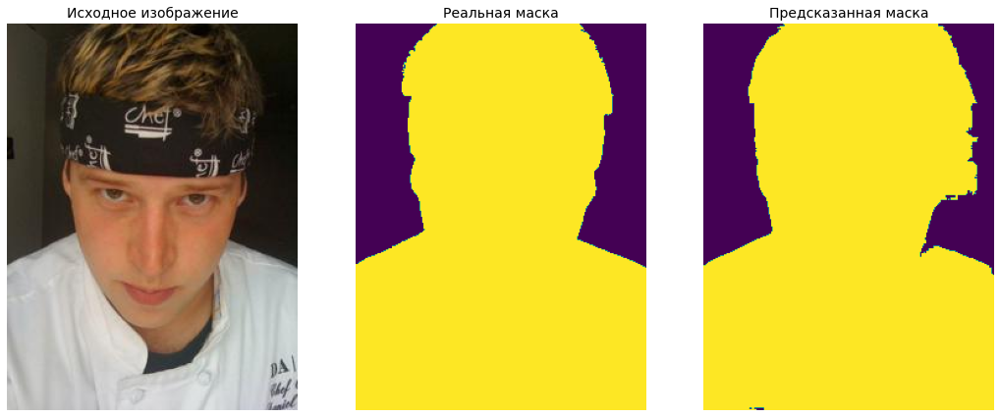

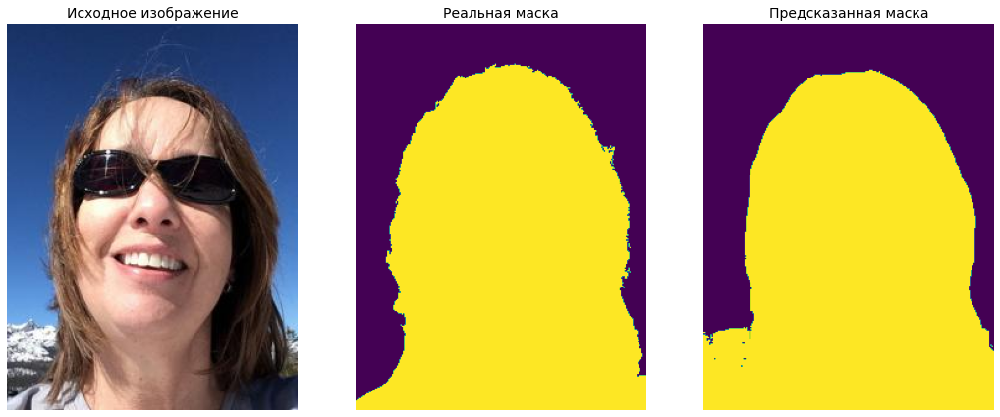

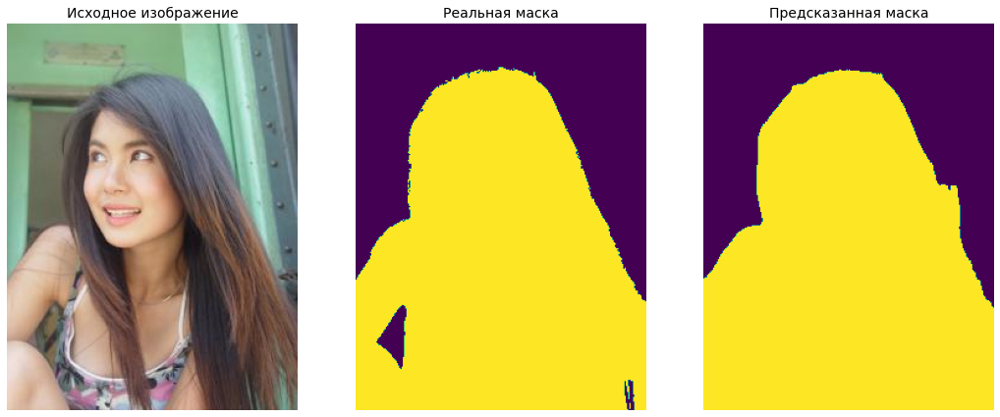

100%|██████████| 25/25 [1:54:23<00:00, 274.54s/it]


In [ ]:
sdunet, history = train_model(sdunet, criterion, optimizer, train_augmented_batch_gen_1, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### LinkNet + augmentations1

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'LinkNet',
    'pretrained_weights': 'linknet_1_best.pt',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'see augmentations_transform_1',
    'post-processing': 'none',
    'num_epochs': 25,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.0005,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

linknet = LinkNet(**config['params'])
linknet.load_state_dict(torch.load(os.path.join('/content/drive/MyDrive/MILTestTasks/models/', config['pretrained_weights'])))
linknet = linknet.to(device)

run = 2
name = f'linknet_augmentations1_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(linknet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 25 of 25 took 124.582 seconds
train loss: 0.23357165034279623
val loss: 0.1893640352734204
train dice: 0.9127843564656771
val dice: 0.9264548844533896


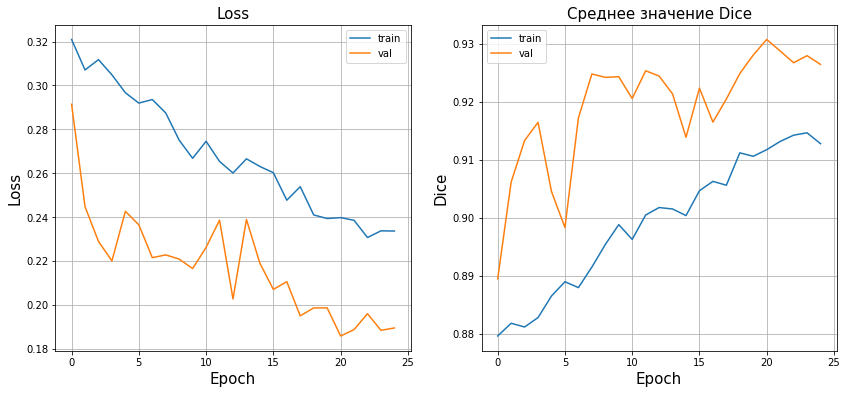

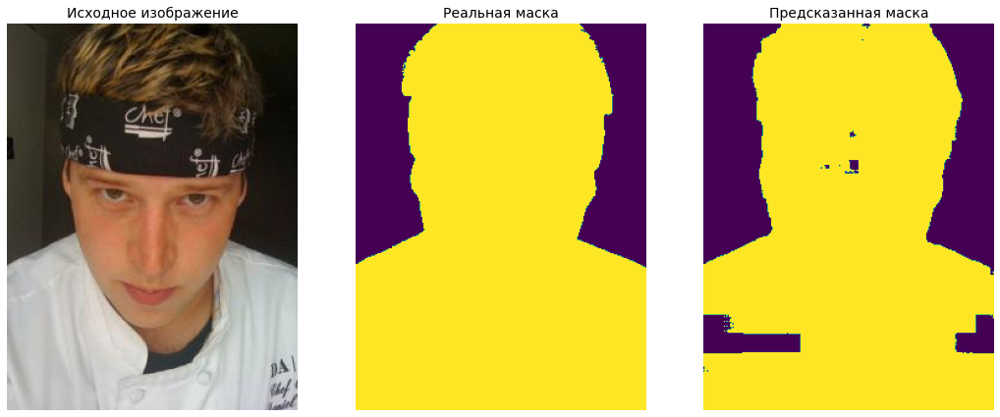

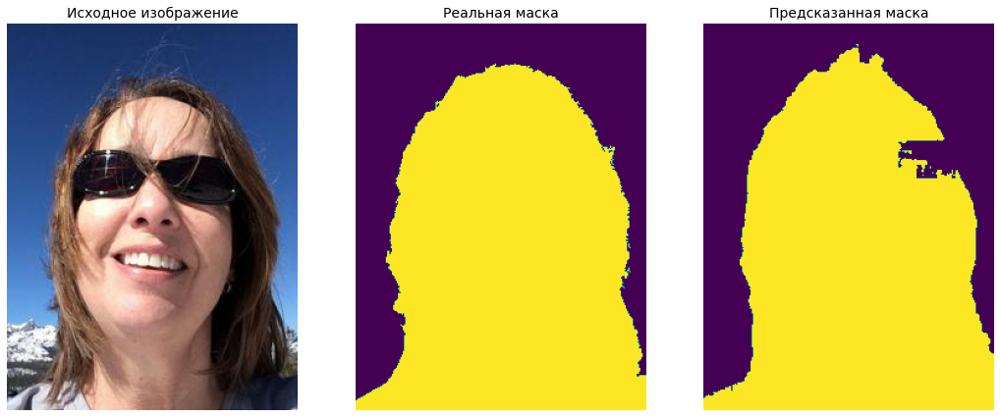

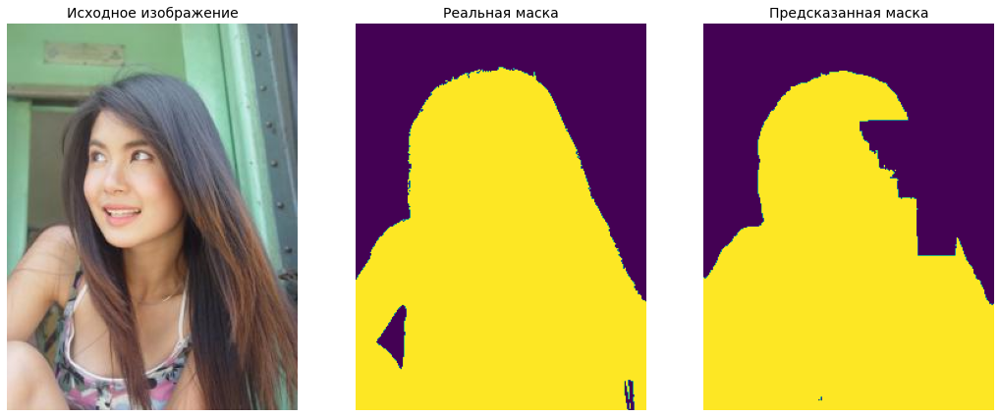

100%|██████████| 25/25 [52:55<00:00, 127.03s/it]


In [ ]:
linknet, history = train_model(linknet, criterion, optimizer, train_augmented_batch_gen_1, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### HRNet + augmentations1

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'HRNet',
    'pretrained_weights': 'hrnet_2_best.pt',
    'params': {'in_channels': 3, 'out_channels': 1},
    'augmentations': 'see augmentations_transform_1',
    'post-processing': 'none',
    'num_epochs': 25,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.0005,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

hrnet = HRNet(**config['params'])
hrnet.load_state_dict(torch.load(os.path.join('/content/drive/MyDrive/MILTestTasks/models/', config['pretrained_weights'])))
hrnet = hrnet.to(device)

run = 3
name = f'hrnet_augmentations1_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(hrnet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

wandb: Currently logged in as: bumchik2 (bumchik2_team). Use `wandb login --relogin` to force relogin


Epoch 25 of 25 took 185.651 seconds
train loss: 0.35243015361829405
val loss: 0.3553063981491944
train dice: 0.9455177570409004
val dice: 0.9565522387572118


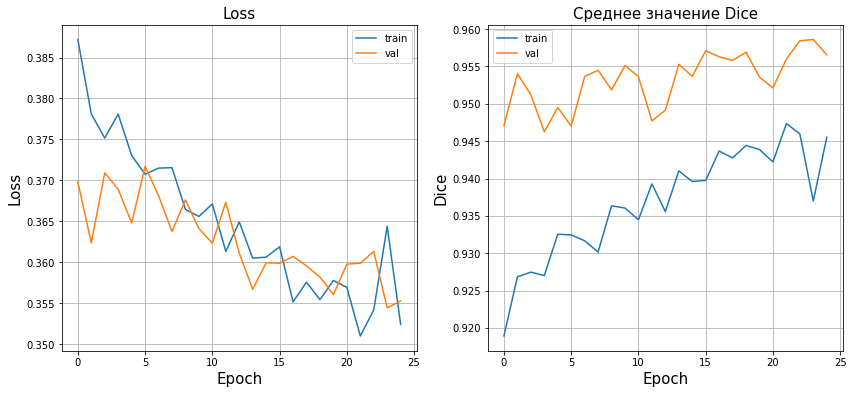

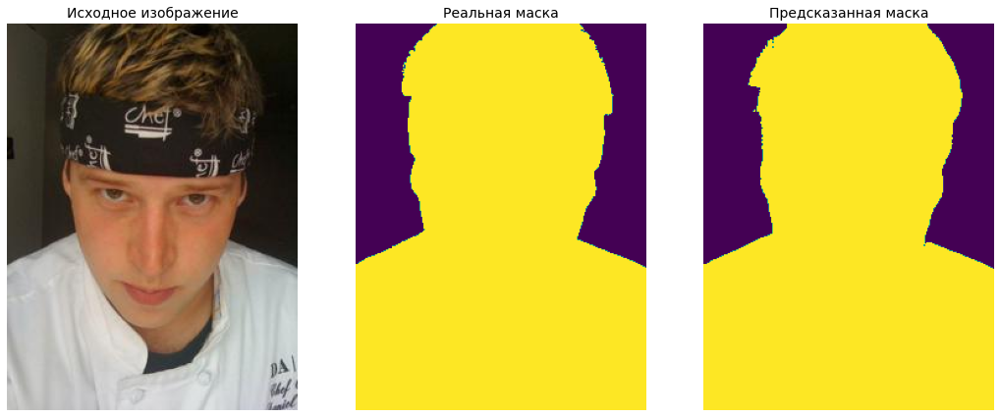

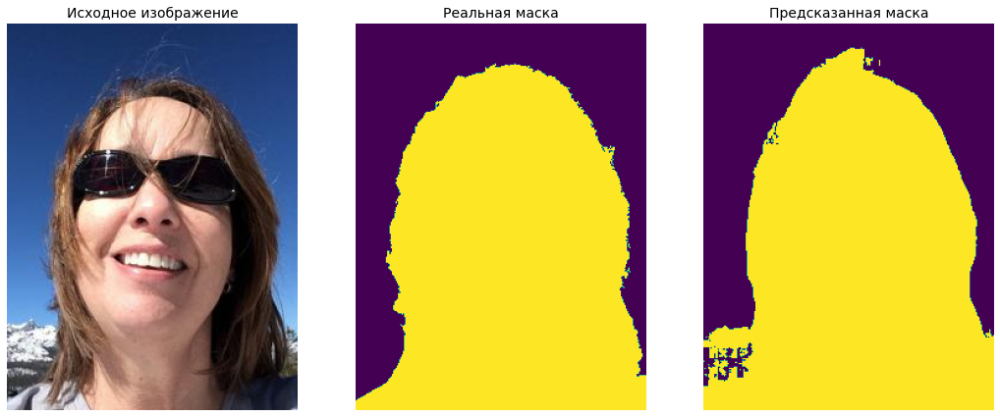

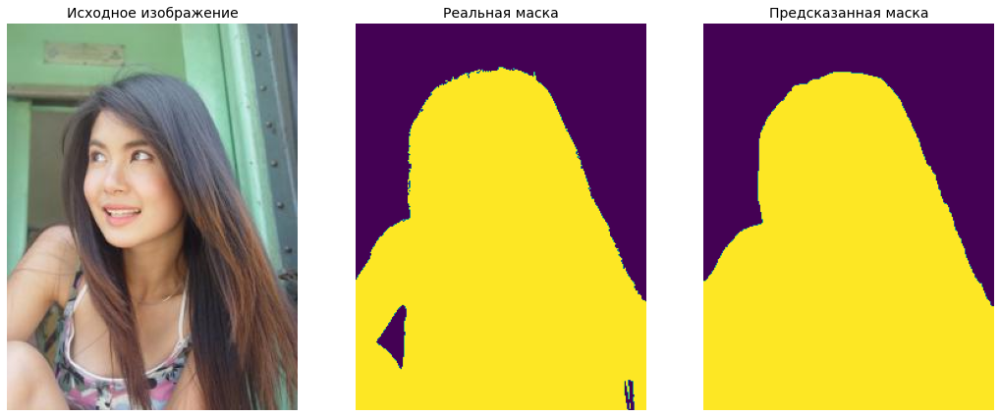

100%|██████████| 25/25 [1:18:55<00:00, 189.41s/it]


In [ ]:
hrnet, history = train_model(hrnet, criterion, optimizer, train_augmented_batch_gen_1, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

# Metrics so far

In [ ]:
run_ids_augmentations1 = ['pln4asmc', 'fhniugmq', '25e3yvaa', '3lqymzcf']

In [ ]:
%%time
criterion = nn.BCEWithLogitsLoss().to(device)
experiments_df = get_experiments_df(weights_dir, run_ids_augmentations1, criterion, 
                                    train_initial_batch_gen, val_batch_gen, experiments_df)

CPU times: user 4min 45s, sys: 880 ms, total: 4min 46s
Wall time: 4min 53s


In [ ]:
experiments_df

,run_id,run_name,model_name,pretrained_weights,num_epochs,val_loss,val_dice,train_loss,train_dice
0,3i4uqxlh,vanilla_unet_1,VanillaUNet,None,25,0.16999,0.94913,0.13602,0.96174
1,2kzf0p5b,sdunet_1,SDUNet,None,25,0.14365,0.95207,0.10383,0.96804
2,2dz6j77q,linknet_1,LinkNet,None,25,0.22655,0.91866,0.19992,0.93044
3,ep6g98jx,hrnet_1,HRNet,None,25,0.43186,0.87979,0.41063,0.88871
4,35wog0h3,hrnet_2,HRNet,hrnet_1_best.pt,50,0.36174,0.95942,0.31496,0.97897
5,pln4asmc,vanilla_unet_augmentations1_2,VanillaUNet,vanilla_unet_1_best.pt,25,0.11870,0.95723,0.09208,0.96901
6,fhniugmq,sdunet_augmentations1_2,SDUNet,sdunet_1_best.pt,25,0.12922,0.95093,0.08706,0.97025
7,25e3yvaa,linknet_augmentations1_2,LinkNet,linknet_1_best.pt,25,0.18572,0.93076,0.16382,0.94124
8,3lqymzcf,hrnet_augmentations1_3,HRNet,hrnet_2_best.pt,25,0.35443,0.95862,0.32572,0.97020


# Augmentations + smaller sizes of images



Хочется попробовать обучаться на уменьшенных изображениях, тогда мы сможем сделать гораздо больше эпох за то же время. Добавим к уже имеющемуся набору аугментаций Resize, изменяющий размер изображения на (192 x 144)

При этом, конечно, есть довольно большая опасность, что модель научиться хорошо работать на маленьких изображениях, но разучиться работать на картинках исходного размера.

Первый эксперимент проведем над LinkNet: похоже, что во время обучения она продолжает довольно быстро улучшать метрики, то есть, ее в любом случае нужно дообучать.

In [26]:
# Заменяем Resize(image_height, image_width) на (image_height, image_width)
smaller_size = (192, 144)
augmentations2_list = [A.Resize(*smaller_size)] + augmentations1_list[1:]
augmentations_transform_2 = A.Compose(augmentations2_list)

train_augmented_dataset_2 = SegmentationDataset(os.path.join(data_path, 'data/train'), 
                                                os.path.join(data_path, 'data/train_mask'),
                                                augmentations_transform_2, mode='train')

train_augmented_batch_gen_2 = torch.utils.data.DataLoader(train_augmented_dataset_2, batch_size=batch_size, shuffle=True, drop_last=False)

# Training with augmentations2 (low resolution models)

### Дообучаю Linknet с augmentations2

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'LinkNet',
    # loss на валидации улучшился после применения аугментаций, поэтому 
    # используем веса, полученные после цикла обучения с аугментациями
    'pretrained_weights': 'linknet_augmentations1_2_best.pt',
    'params': {'in_channels': 3, 'out_channels': 1},
    'resize': smaller_size,
    'augmentations': 'see augmentations_transform_2',
    'post-processing': 'none',
    'num_epochs': 75,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.0005,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

low_res_linknet = LinkNet(**config['params'])
low_res_linknet.load_state_dict(torch.load(os.path.join('/content/drive/MyDrive/MILTestTasks/models/', config['pretrained_weights'])))
low_res_linknet = low_res_linknet.to(device)

run = 3
name = f'linknet_augmentations2_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(low_res_linknet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 75 of 75 took 67.012 seconds
train loss: 0.12133638620829854
val loss: 0.20044463184373132
train dice: 0.9580477013765626
val dice: 0.929842110884329


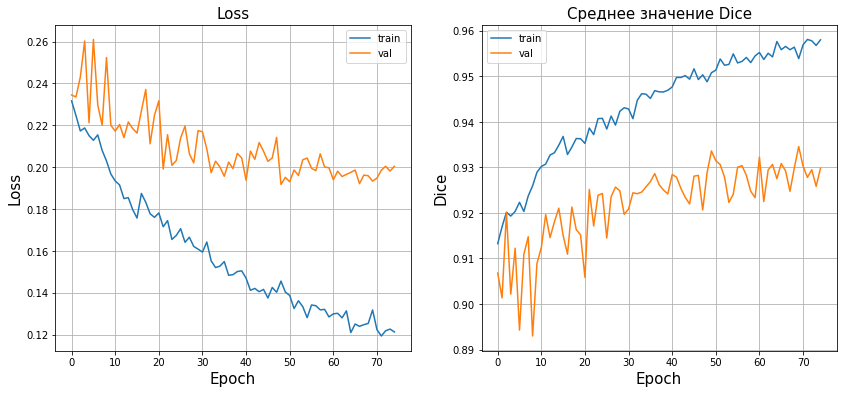

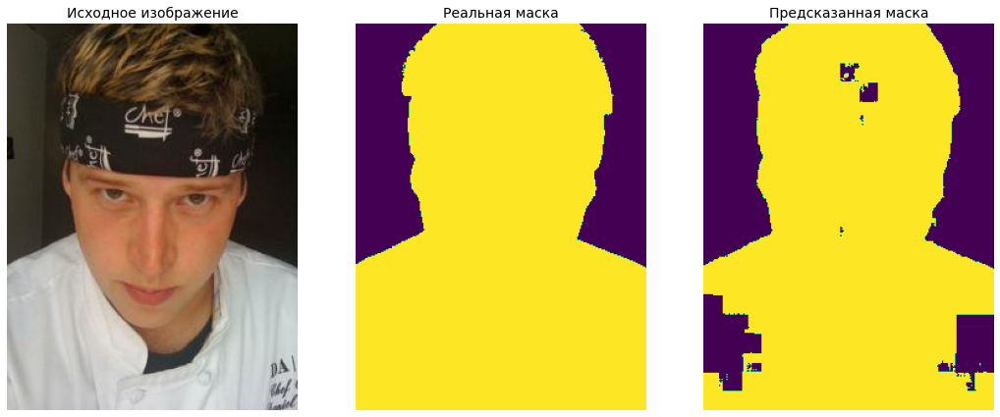

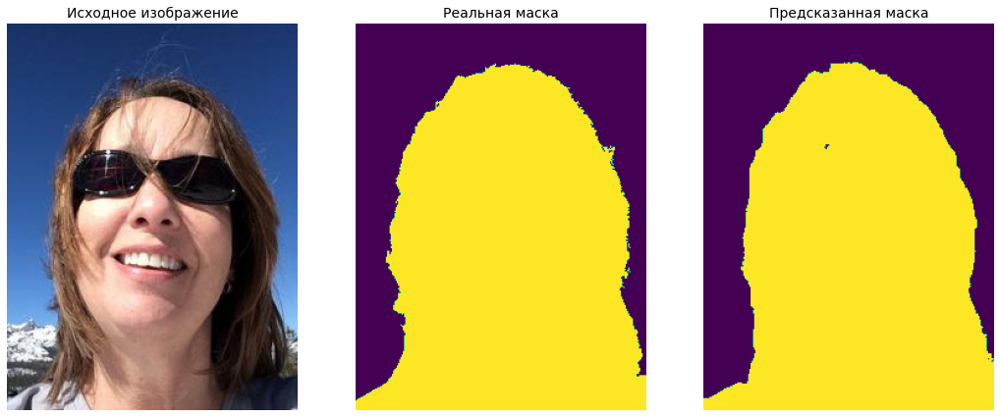

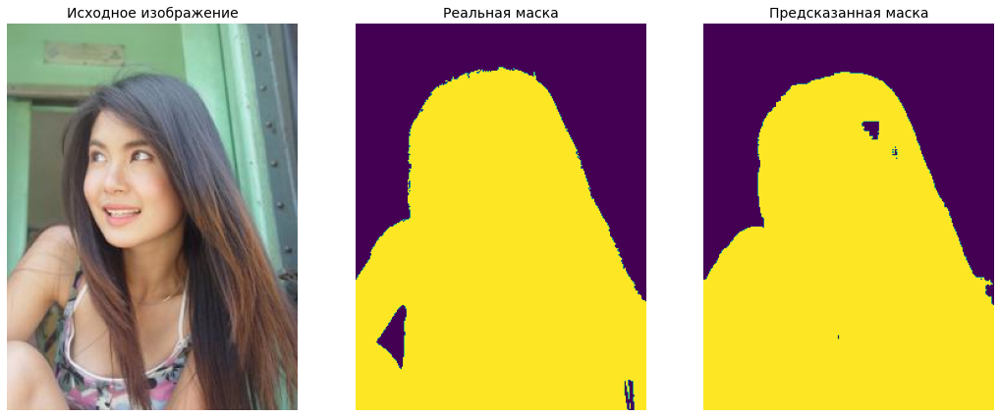

100%|██████████| 75/75 [1:25:49<00:00, 68.67s/it]


dice_train,▁
dice_val,▁
loss_train,▁
loss_val,▁
dice_train,0.91326
dice_val,0.9068
loss_train,0.23166
loss_val,0.23449


In [ ]:
low_res_linknet, history = train_model(low_res_linknet, criterion, optimizer, train_augmented_batch_gen_2, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

Видим, что качество на валидации если и растет, то медленно, на самой тренировочной выборке с уменьшенными аугментированными картинками качество растет гораздо быстрее.

Можно было бы сделать следующее: относительно быстро обучить low-resolution модели, хорошо работающие с уменьшенными картинками. Все картинки, поступающие в эти модели можно ресайзить до этого уменьшенного размера, а результаты модели обратно апскейлить (например, используя билинейную интерполяцию).

### HRNet + augmentations2

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'HRNet',
    'params': {'in_channels': 3, 'out_channels': 1},
    'resize': smaller_size,
    'augmentations': 'see augmentations_transform_2',
    'post-processing': 'none',
    'num_epochs': 100,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

low_res_hrnet = HRNet(**config['params'])
low_res_hrnet = low_res_hrnet.to(device)

run = 1
name = f'lowres_hrnet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(low_res_hrnet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 100 of 100 took 66.626 seconds
train loss: 0.3400375632845404
val loss: 0.3789892208987269
train dice: 0.9555720535781151
val dice: 0.9365195832566788


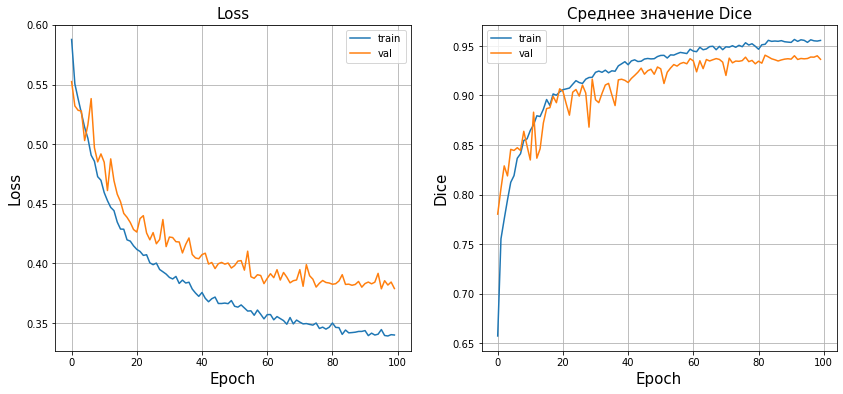

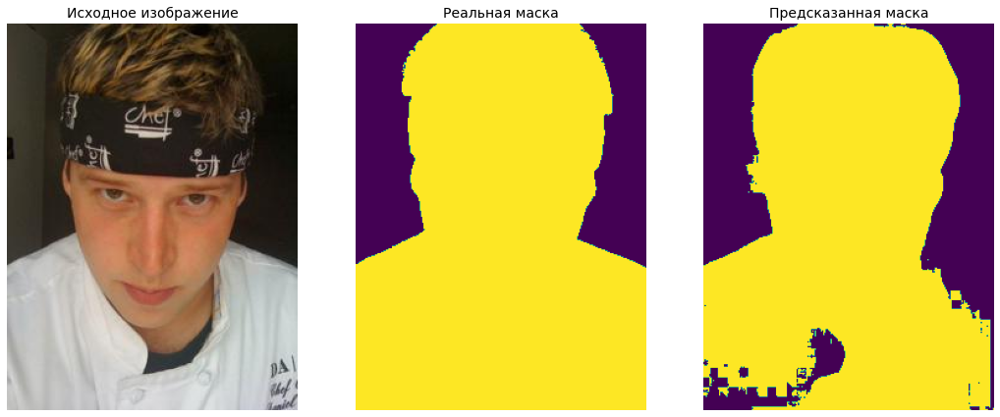

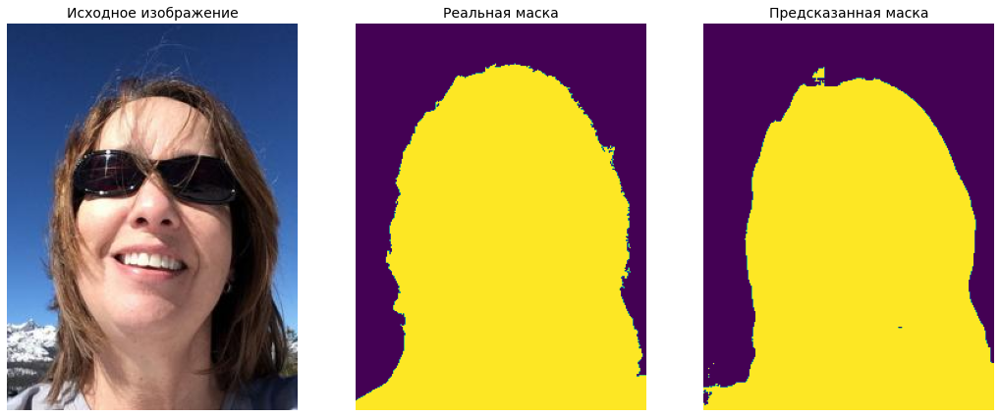

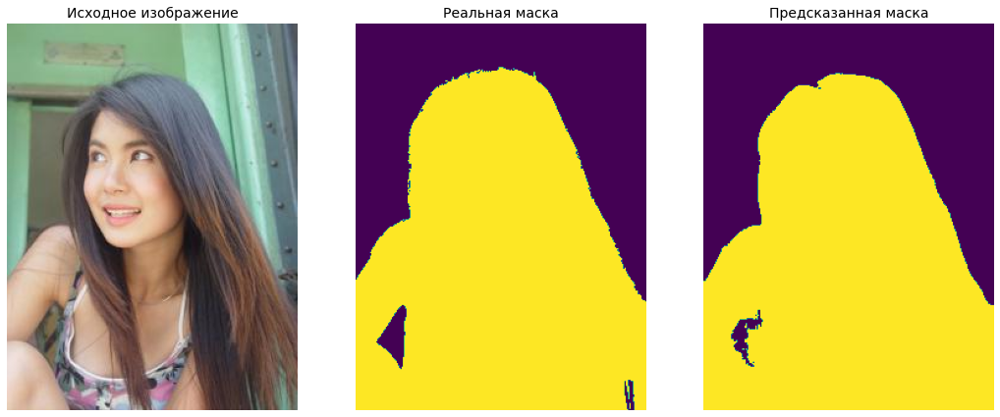

100%|██████████| 100/100 [1:54:44<00:00, 68.84s/it]


dice_train,▁▄▅▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████████████████████
dice_val,▁▃▄▄▃▃▆▆▆▅▆▆▆▇▆▇▇▇▇▇▇▇███▇██████████████
loss_train,█▇▆▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_val,█▇▇▆▅▅▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
dice_train,0.95557
dice_val,0.93652
loss_train,0.34004
loss_val,0.37899


In [ ]:
low_res_hrnet, history = train_model(low_res_hrnet, criterion, optimizer, train_augmented_batch_gen_2, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### Vanilla UNet + augmentations2

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'VanillaUNet',
    'params': {'in_channels': 3, 'out_channels': 1},
    'resize': smaller_size,
    'augmentations': 'see augmentations_transform_2',
    'post-processing': 'none',
    'num_epochs': 75,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

low_res_vanilla_unet = VanillaUNet(**config['params'])
low_res_vanilla_unet = low_res_vanilla_unet.to(device)

run = 1
name = f'lowres_vanilla_unet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(low_res_vanilla_unet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

wandb: Currently logged in as: bumchik2 (bumchik2_team). Use `wandb login --relogin` to force relogin


Epoch 75 of 75 took 90.744 seconds
train loss: 0.10494794774191461
val loss: 0.17026857466533266
train dice: 0.9636154461387421
val dice: 0.9403887194802417


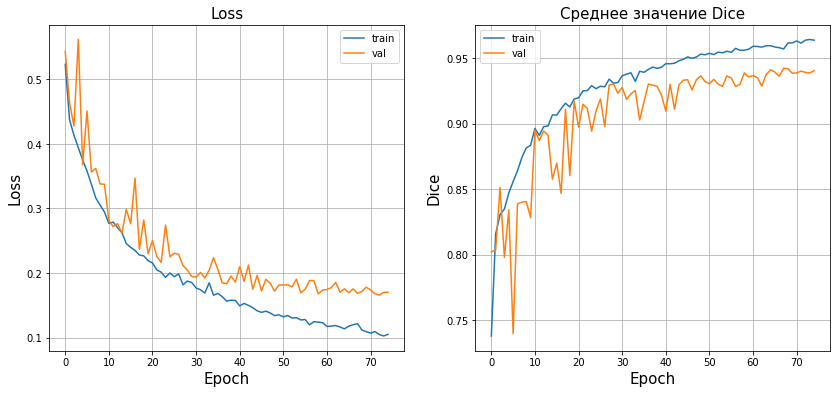

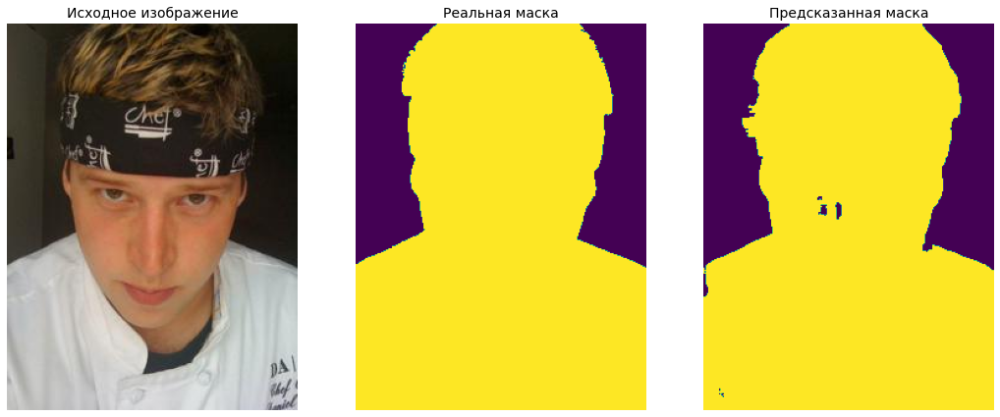

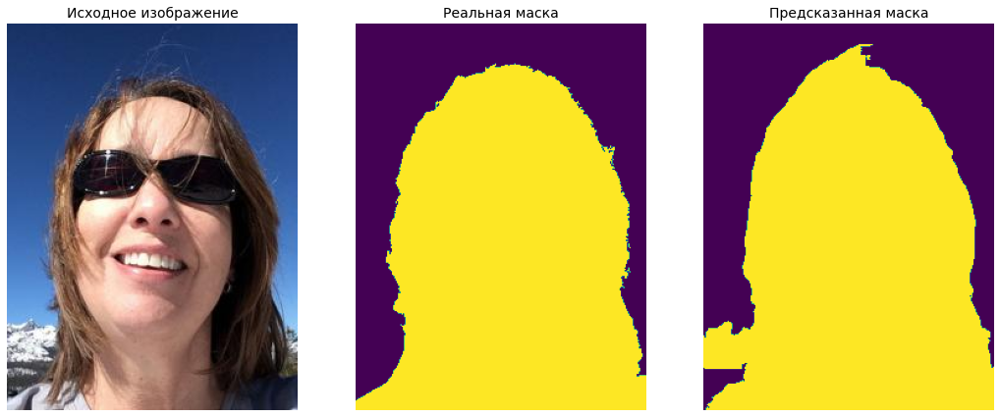

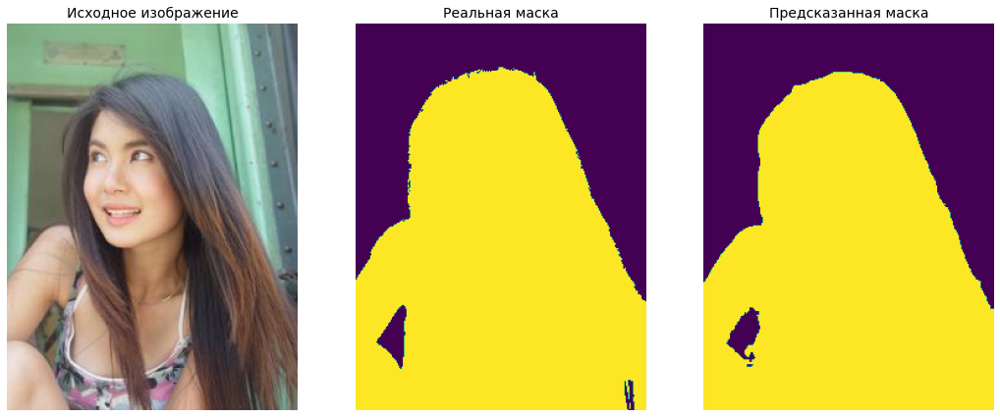

100%|██████████| 75/75 [1:56:45<00:00, 93.41s/it]


dice_train,▁▃▄▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
dice_val,▃▃▃▁▄▄▆▆▆▇▅▆▇▇▆██▇▇██▇██████████████████
loss_train,█▇▆▅▅▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_val,█▆█▆▄▄▃▃▃▂▃▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
dice_train,0.96362
dice_val,0.94039
loss_train,0.10495
loss_val,0.17027


In [ ]:
low_res_vanilla_unet, history = train_model(low_res_vanilla_unet, criterion, optimizer,
        train_augmented_batch_gen_2, val_batch_gen, config['num_epochs'],
        save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### SDUNet + augmentations2

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'SDUNet',
    'params': {'in_channels': 3, 'out_channels': 1},
    'resize': smaller_size,
    'augmentations': 'see augmentations_transform_2',
    'post-processing': 'none',
    'num_epochs': 100,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

low_res_sdunet = SDUNet(**config['params'])
low_res_sdunet = low_res_sdunet.to(device)

run = 1
name = f'lowres_sdunet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(low_res_sdunet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 100 of 100 took 43.682 seconds
train loss: 0.08761379373730815
val loss: 0.1764730887166385
train dice: 0.9697778158085573
val dice: 0.9382325677932405


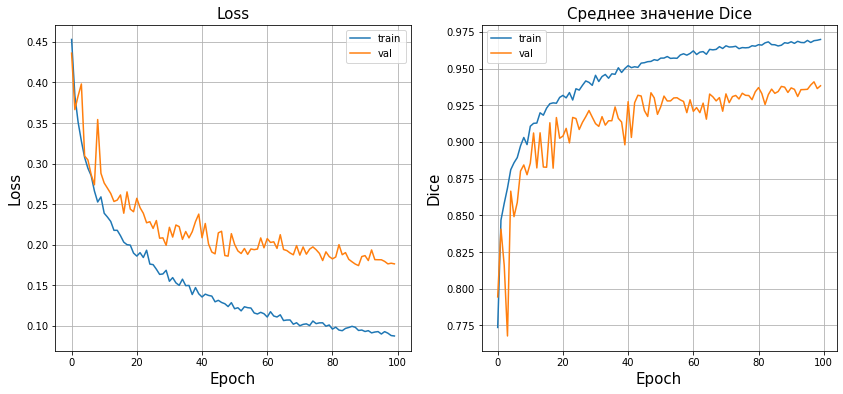

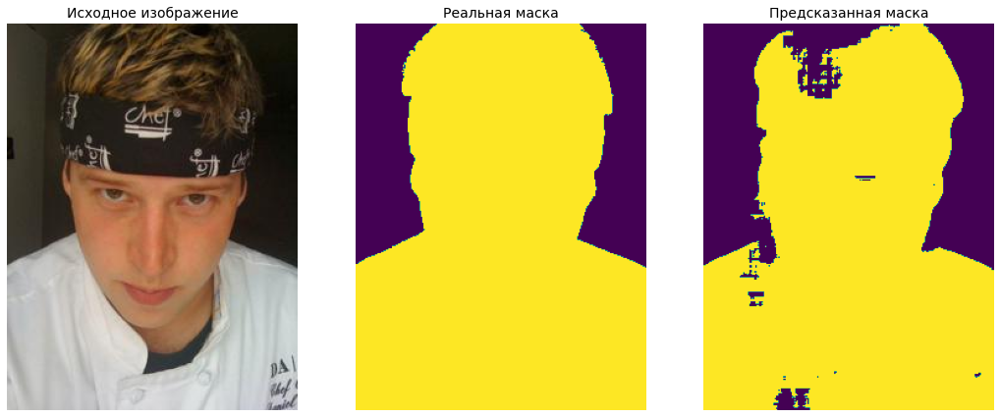

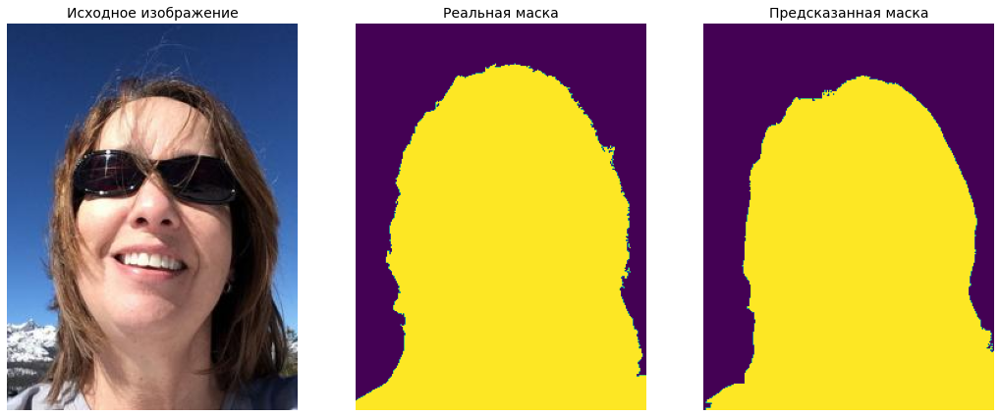

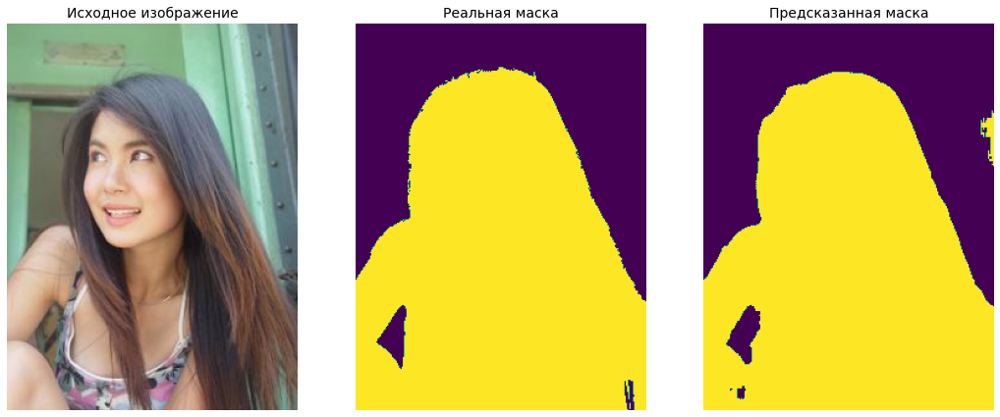

100%|██████████| 100/100 [1:16:49<00:00, 46.10s/it]


dice_train,▁▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████████████████████
dice_val,▁▂▄▅▅▅▅▅▆▆▇▇▇▇▇▇▇█▇█▇▇█▇▇▇██▇███████████
loss_train,█▆▅▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_val,█▇▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▁▂▁▂▂▂▂▂▂▁▁▂▂▁▁▁▁▁▁▁▁▁▁
dice_train,0.96978
dice_val,0.93823
loss_train,0.08761
loss_val,0.17647


In [ ]:
low_res_sdunet, history = train_model(low_res_sdunet, criterion, optimizer,
        train_augmented_batch_gen_2, val_batch_gen, config['num_epochs'], 
        save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

### LinkNet + augmentations2

Ранее мы пробовали дообучать LinkNet на уменьшенных изображениях. Теперь обучим ну уменьшенных изображениях с нуля.

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'LinkNet',
    'params': {'in_channels': 3, 'out_channels': 1},
    'resize': smaller_size,
    'augmentations': 'see augmentations_transform_2',
    'post-processing': 'none',
    'num_epochs': 100,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.975
}

low_res_linknet = LinkNet(**config['params'])
low_res_linknet = low_res_linknet.to(device)

run = 1
name = f'lowres_linknet_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam(low_res_linknet.parameters(), lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 100 of 100 took 24.238 seconds
train loss: 0.13043397837265364
val loss: 0.2246597412331351
train dice: 0.9545159495886613
val dice: 0.9197468565012112


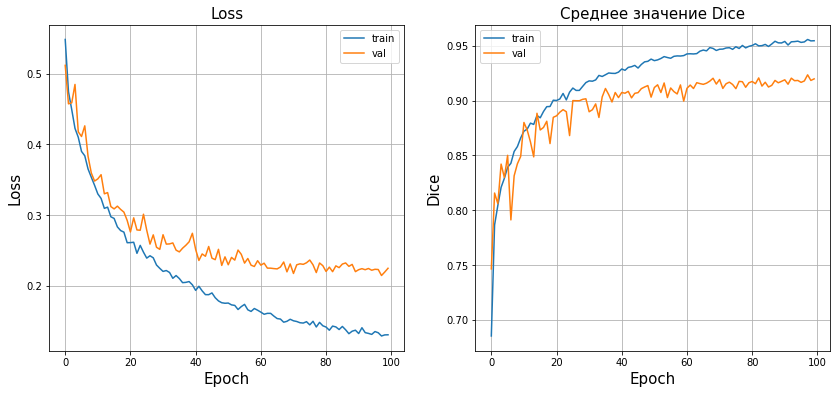

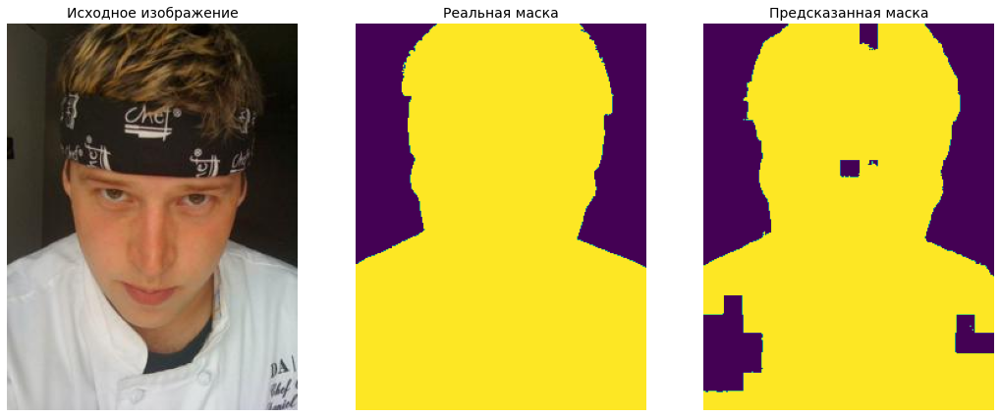

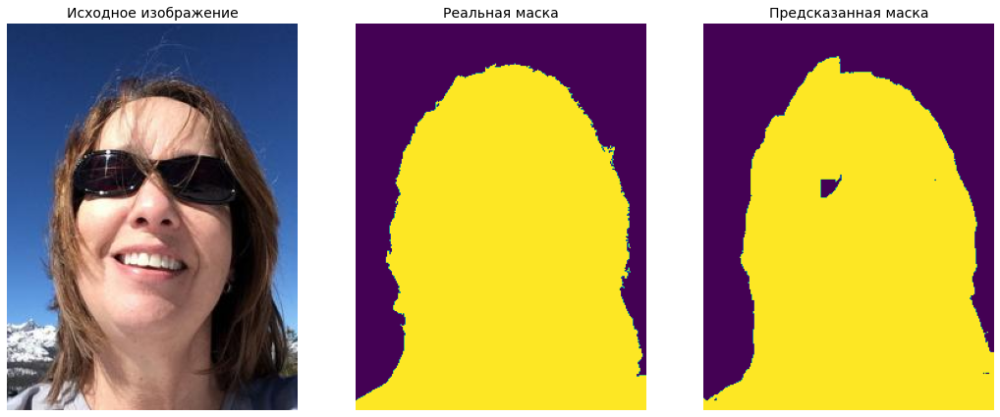

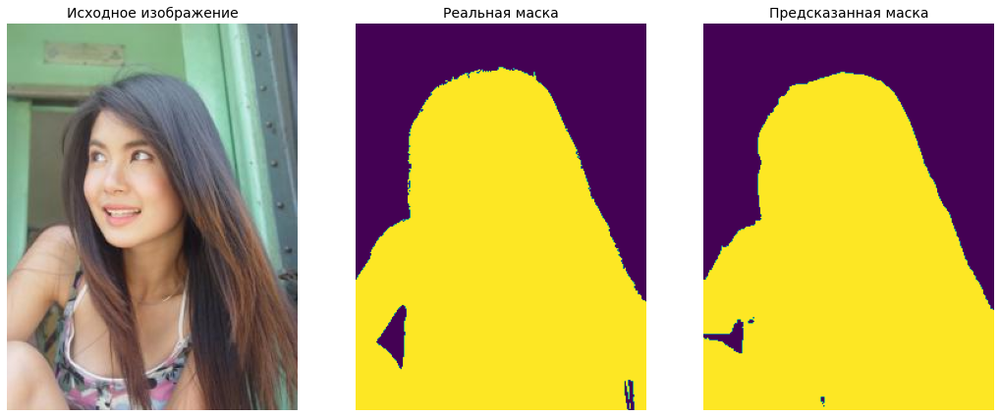

100%|██████████| 100/100 [43:10<00:00, 25.91s/it]


dice_train,▁▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████████████████████
dice_val,▁▃▅▄▆▆▆▆▇▇▇▇▇▇█▇▇▇▇█████████████████████
loss_train,█▆▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
loss_val,█▇▆▅▄▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
dice_train,0.95452
dice_val,0.91975
loss_train,0.13043
loss_val,0.22466


In [ ]:
low_res_linknet, history = train_model(low_res_linknet, criterion, optimizer,
        train_augmented_batch_gen_2, val_batch_gen, config['num_epochs'],
        save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

# Metrics so far

In [ ]:
run_ids_augmentations2 = ['1bvhg5qw', '9q2vzhda', '24tso77h', '1qx29ajc', '1a2djffv']

In [ ]:
%%time
criterion = nn.BCEWithLogitsLoss().to(device)
experiments_df = get_experiments_df(weights_dir, run_ids_augmentations2, criterion, 
                                    train_initial_batch_gen, val_batch_gen, experiments_df)

CPU times: user 5min 25s, sys: 1.09 s, total: 5min 26s
Wall time: 5min 36s


In [ ]:
experiments_df

,run_id,run_name,model_name,pretrained_weights,num_epochs,val_loss,val_dice,train_loss,train_dice
0,3i4uqxlh,vanilla_unet_1,VanillaUNet,None,25,0.16999,0.94913,0.13602,0.96174
1,2kzf0p5b,sdunet_1,SDUNet,None,25,0.14365,0.95207,0.10383,0.96804
2,2dz6j77q,linknet_1,LinkNet,None,25,0.22655,0.91866,0.19992,0.93044
3,ep6g98jx,hrnet_1,HRNet,None,25,0.43186,0.87979,0.41063,0.88871
4,35wog0h3,hrnet_2,HRNet,hrnet_1_best.pt,50,0.36174,0.95942,0.31496,0.97897
5,pln4asmc,vanilla_unet_augmentations1_2,VanillaUNet,vanilla_unet_1_best.pt,25,0.11870,0.95723,0.09208,0.96901
6,fhniugmq,sdunet_augmentations1_2,SDUNet,sdunet_1_best.pt,25,0.12922,0.95093,0.08706,0.97025
7,25e3yvaa,linknet_augmentations1_2,LinkNet,linknet_1_best.pt,25,0.18572,0.93076,0.16382,0.94124
8,3lqymzcf,hrnet_augmentations1_3,HRNet,hrnet_2_best.pt,25,0.35443,0.95862,0.32572,0.97020
9,1bvhg5qw,linknet_augmentations2_3,LinkNet,linknet_augmentations1_2_best.pt,75,0.19176,0.92885,0.16107,0.94123


**Выводы:**

- видим, что лучшие метрики для каждой из архитектур получились после дообучения с набором аугментаций augmentations1 (для HRNet val_dice немного лучше был в run_id 35wog0h3, но там был больше val_loss и модель была сильнее переобучена). Это связано с тем, что 25 эпох - довольно мало и поэтому за первый цикл обучения большинство моделей не успели сойтись к оптимальным параметрам.
- если сравнивать архитектуры между собой, то лучшее значение val_dice получилось у HRNet, а худшее - у LinkNet. Возможно, LinkNet нужно было дать еще побольше времени пообучаться. HRNet мы обучали дольше всех, так что это в целом неудивительно, что модель дает хорошие результаты.
- в целом у всех архитектур довольно близкие значения val_dice, возможно, они ошибаются похожим образом на каких-то сложных картинках.
- проблема lowres моделей, скорее всего, в том, что они обучались на маленьких изображениях 192x144, а тестируются на 320x240.

In [ ]:
experiments_df.to_excel('/content/experiments_df.xlsx')
from google.colab import files
files.download('/content/experiments_df.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Посмотрим на метрики, которые получатся у linknet и hrnet, обученных на уменьшенных картинках, если применять описанную ранее идею: сначала уменьшаем входы до размеров, на которых обучались модели, применяем модель и потом предсказания обратно апскейлим.

In [29]:
from post_processing.resize_aggregator import ResizeAggregator

In [ ]:
criterion = nn.BCEWithLogitsLoss().to(device)

for run_id in run_ids_augmentations2:
    low_res_model = load_model(run_id, weights_dir, device)
    low_res_aggregator = ResizeAggregator(low_res_model, [smaller_size])
    run = wandb_api.run(f'human_segmentation/{run_id}')
    run_name = run.name
    model_name = run.config.get('model_name')
    print(model_name, run_id, run_name)
    print('Метрики на валидации:', get_metrics(low_res_model, criterion, val_batch_gen))
    print('Метрики на валидации с ResizeAggregator:', get_metrics(low_res_aggregator, criterion, val_batch_gen))
    print()

LinkNet 1bvhg5qw linknet_augmentations2_3
Метрики на валидации: {'loss': 0.19175898699924865, 'dice': 0.9288543796295022}
Метрики на валидации с ResizeAggregator: {'loss': 0.1177543339030496, 'dice': 0.9585167735998231}

HRNet 9q2vzhda lowres_hrnet_1
Метрики на валидации: {'loss': 0.3787750250306623, 'dice': 0.9373338149036152}
Метрики на валидации с ResizeAggregator: {'loss': 0.3536505812201007, 'dice': 0.9593433060939599}

VanillaUNet 24tso77h lowres_vanilla_unet_1
Метрики на валидации: {'loss': 0.1658542698827283, 'dice': 0.9390866649419249}
Метрики на валидации с ResizeAggregator: {'loss': 0.11184050429227023, 'dice': 0.9598817152471643}

SDUNet 1qx29ajc lowres_sdunet_1
Метрики на валидации: {'loss': 0.17433701825552972, 'dice': 0.9373079679105019}
Метрики на валидации с ResizeAggregator: {'loss': 0.11698860301282898, 'dice': 0.9598902099833418}

LinkNet 1a2djffv lowres_linknet_1
Метрики на валидации: {'loss': 0.2144162874797295, 'dice': 0.9234291035131681}
Метрики на валидации с R

Как видим, эта идея сработала, похоже, модели, действительно, хорошо научились работать с изображениями маленького размера и теперь, прежде чем их применять, стоит сначала ресайзить входные картинки к соответствующиму уменьшенному размеру.

# Model Selection

Выберем из таблички выше лучшие по значению val_loss веса для каждой архитектуры, а также low-res модели, которые мы обучали на уменьшенных изображениях. Далее будем пробовать как-то комбинировать / пост-процессить результаты этих моделей.

In [27]:
# для каждой из моделей VanillaUNet, SDUNet, LinkNet и HRNet выберем берем запуск
# с набором аугментаций augmentations1 - там модели имеют наилучшие значения val_loss для каждого класса
# в дальнейшем будем называть эти модели "high-resolution моделями"
high_res_model_run_ids = ['pln4asmc', 'fhniugmq', '25e3yvaa', '3lqymzcf']

# аналогично для моделей VanillaUNet, SDUNet, LinkNet, HRNet берем запуски, когда мы
# обучались на уменьшенных изображениях (набор аугментаций augmentations2)
# в дальнейшем будем называть эти модели "low-resolution моделями"
low_res_model_run_ids = ['24tso77h', '1qx29ajc', '1a2djffv', '9q2vzhda']

In [31]:
high_res_models = [load_model(run_id, weights_dir, device) for run_id in high_res_model_run_ids]
low_res_models = [load_model(run_id, weights_dir, device) for run_id in low_res_model_run_ids]

# Для low-resolution моделей создаем ResizeAggregator'ы. Как мы убедились, 
# при их использовании метрики получаются значительно лучше
low_res_model_aggregators = [ResizeAggregator(low_res_model, [smaller_size]) for low_res_model in low_res_models]

# Postprocessing

Для комбинирования нескольких моделей будем использовать LinearCombinationEnsemble

In [32]:
from post_processing.linear_combination_ensemble import LinearCombinationEnsemble

Попробуем взять комбинацию с одинаковыми весами high-res моделей

In [ ]:
model_ensemble1 = LinearCombinationEnsemble(
    high_res_models
).to(device)

In [ ]:
criterion = nn.BCEWithLogitsLoss().to(device)
print('Метрики model_ensemble1 на валидационной выборке:')
print(get_metrics(model_ensemble1, criterion, val_batch_gen))
print('Метрики model_ensemble1 на тренировочной выборке:')
print(get_metrics(model_ensemble1, criterion, train_initial_batch_gen))

Метрики model_ensemble1 на валидационной выборке:
{'loss': 0.13115206037102076, 'dice': 0.9610694202696403}
Метрики model_ensemble1 на тренировочной выборке:
{'loss': 0.1034621081878024, 'dice': 0.9744528940982707}


Заметим, что и на валидации и на train у этого ансамбля метрики лучше, чем у любой модели по отдельности

Попробуем взять комбинацию с одинаковыми весами low-res ресайз-агрегаторов:

In [ ]:
model_ensemble2 = LinearCombinationEnsemble(
    low_res_model_aggregators
).to(device)

In [ ]:
criterion = nn.BCEWithLogitsLoss().to(device)
print('Метрики model_ensemble2 на валидационной выборке:')
print(get_metrics(model_ensemble2, criterion, val_batch_gen))
print('Метрики model_ensemble2 на тренировочной выборке:')
print(get_metrics(model_ensemble2, criterion, train_initial_batch_gen))

Метрики model_ensemble2 на валидационной выборке:
{'loss': 0.10297643160768624, 'dice': 0.9661584579277258}
Метрики model_ensemble2 на тренировочной выборке:
{'loss': 0.061804616598575286, 'dice': 0.9823297518929737}


Заметим, что и на валидации и на train у этого ансамбля метрики лучше, чем у любой модели по отдельности. При этом у этого ансамбля метрики получились лучше, чем у model_ensemble1

Попробуем взять комбинацию с одинаковыми весами high-res моделей и low-res ресайз-агрегаторов 

In [ ]:
model_ensemble3 = LinearCombinationEnsemble(
    high_res_models + low_res_model_aggregators
).to(device)

In [ ]:
criterion = nn.BCEWithLogitsLoss().to(device)
print('Метрики model_ensemble3 на валидационной выборке:')
print(get_metrics(model_ensemble3, criterion, val_batch_gen))
print('Метрики model_ensemble3 на тренировочной выборке:')
print(get_metrics(model_ensemble3, criterion, train_initial_batch_gen))

Метрики model_ensemble3 на валидационной выборке:
{'loss': 0.10744563433630713, 'dice': 0.9677089577901546}
Метрики model_ensemble3 на тренировочной выборке:
{'loss': 0.07384367039561725, 'dice': 0.9819194852007884}


Заметим, что и на валидации и на train у этого ансамбля метрики лучше, чем у любой модели по отдельности. val_dice немного лучше, чем у model_ensemble2, но val_loss и метрики на train - хуже. Также model_ensebmle3 гораздо медленнее, ведь model_ensemble2 работает с уменьшенными картинками (т.к. состоит из low-res resize агрегаторов), а model_ensebmle3 работает и с уменьшенными картинками и с картинками обычного размера.

Попробуем обучить параметр weight_logits в LinearCombinationEnsemble из high_res_models, чтобы подобрать более оптимальные веса в линейной комбинации моделей.

In [ ]:
# set_seed(config['seed']) - это нужно делать для воспроизводимости результатов
# но я этого сейчас не делаю, поскольку это увеличивает время обучения ~ в 2 раза

config = {
    'seed': 42,
    'model_name': 'LinearCombinationEnsemble',
    'models in ensemble': ['HRNet', 'LinkNet', 'SDUNet', 'VanillaUNet'],
    'augmentations': 'horizontal flip; slight rescaling',
    'post-processing': 'none',
    'num_epochs': 10,
    'train_batch_size': batch_size,
    'val_batch_size': batch_size,
    'criterion': 'BCEWithLogitsLoss',
    'optimizer': 'Adam',
    'initial_learning_rate': 0.001,
    'scheduler': 'ExponentialLR',
    'scheduler_gamma': 0.75
}

model_ensemble = LinearCombinationEnsemble(high_res_models).to(device)

run = 1
name = f'model_ensemble_{run}'
use_wandb = True
if use_wandb:
    wandb.init(project='human_segmentation', name=name, config=config)

criterion = nn.BCEWithLogitsLoss().to(device)
optimizer = torch.optim.Adam([model_ensemble.weight_logits], lr=config['initial_learning_rate'])
save_prefix = os.path.join(weights_dir, name)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=config['scheduler_gamma'])

Epoch 10 of 10 took 345.128 seconds
train loss: 0.10454533554528603
val loss: 0.1251726568259042
train dice: 0.9707127157413177
val dice: 0.961038898115336


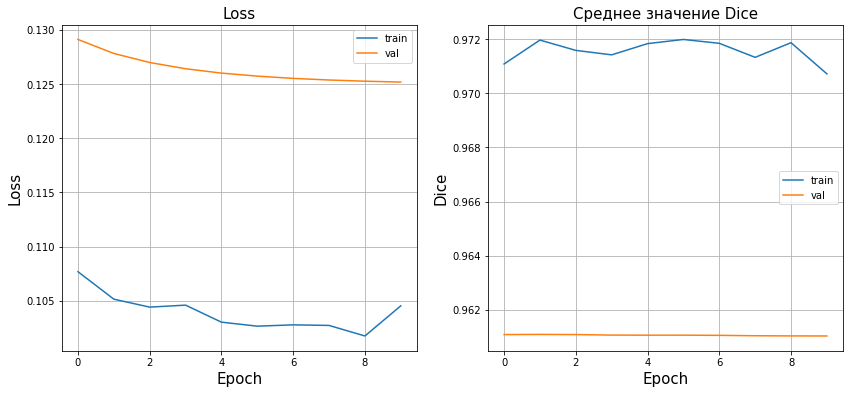

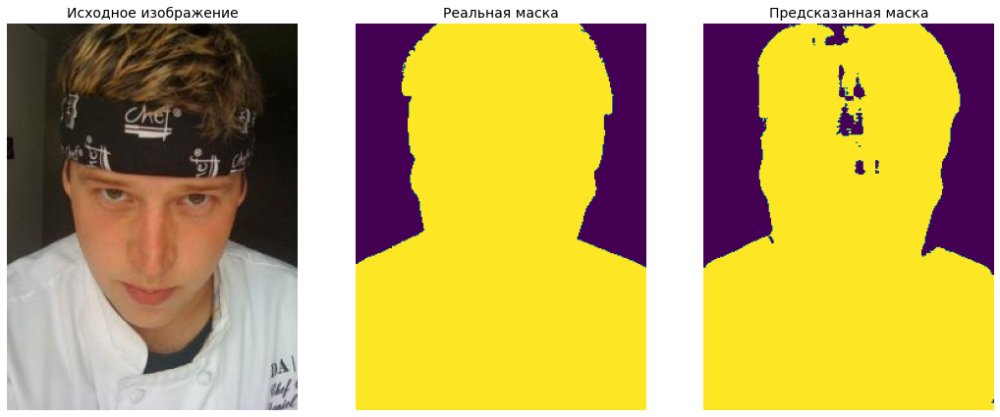

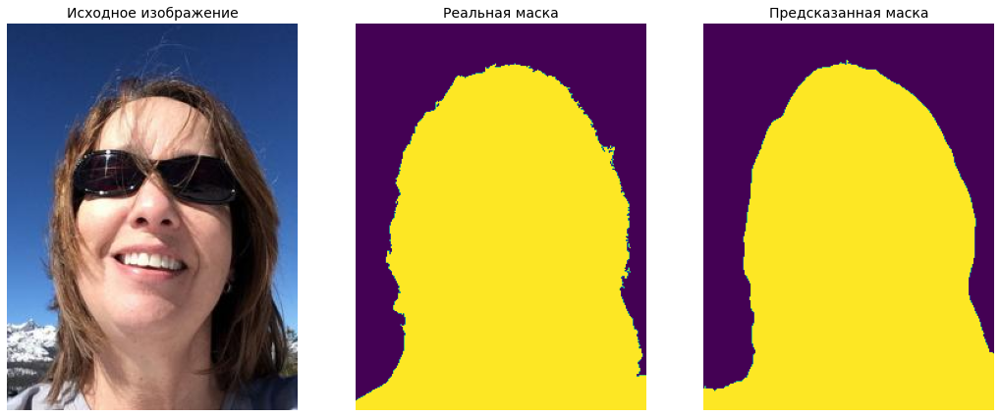

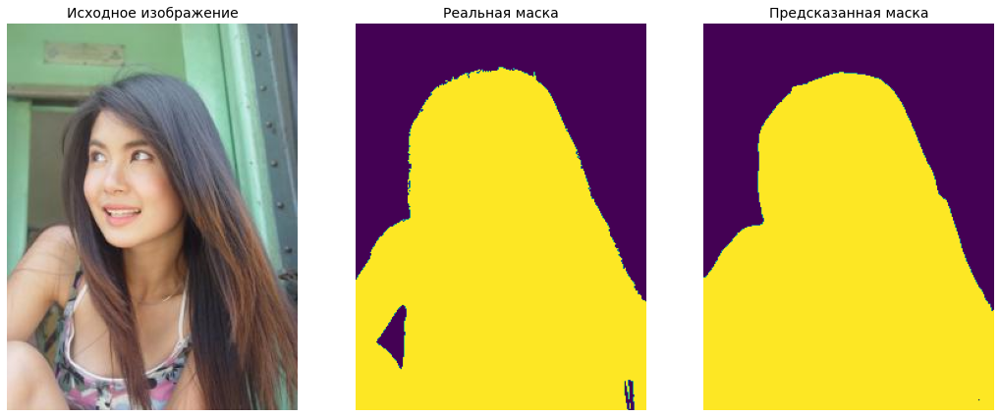

100%|██████████| 10/10 [58:05<00:00, 348.52s/it]


dice_train,▃█▆▅▇█▇▄▇▁
dice_val,▇█▇▅▅▅▄▂▁▁
loss_train,█▅▄▄▃▂▂▂▁▄
loss_val,█▆▄▃▂▂▂▁▁▁
dice_train,0.97071
dice_val,0.96104
loss_train,0.10455
loss_val,0.12517


In [ ]:
model_ensemble, history = train_model(model_ensemble, criterion, optimizer, train_batch_gen, val_batch_gen,
        config['num_epochs'], save_prefix, test_transform, images_paths, masks_paths, scheduler, use_wandb)

In [ ]:
print('Получившиеся веса при каждой из моделей:')

weights = F.softmax(model_ensemble.weight_logits, dim=0)

for model_name, weight in zip(['VanillaUNet', 'SDUNet', 'LinkNet', 'HRNet'], weights):
    print(model_name, weight)

Получившиеся веса при каждой из моделей:
HRNet tensor(0.1850, grad_fn=<UnbindBackward0>)
LinkNet tensor(0.1838, grad_fn=<UnbindBackward0>)
SDUNet tensor(0.3162, grad_fn=<UnbindBackward0>)
VanillaUNet tensor(0.3150, grad_fn=<UnbindBackward0>)


Как видим, целевая метрика val_dice почти не меняется по мере обучения и в итоге получилась даже немного хуже, чем было в начале (при одинаковых значениях весов val_dice равен 0.9610694202696403). Поэтому для простоты в дальнейшем будем использовать комбинации с одинаковыми весами.

In [ ]:
model_ensemble1 = LinearCombinationEnsemble(high_res_models)

**Далее будем использовать model_ensemble2 - комбинация из 4 low-res resize агрегаторов.** У этого ансамбля получились наилучшие значения val_loss, train_loss, train_dice: 

Метрики model_ensemble2 на валидационной выборке:

{'loss': 0.10297643160768624, 'dice': 0.9661584579277258}

Метрики model_ensemble2 на тренировочной выборке:

{'loss': 0.061804616598575286, 'dice': 0.9823297518929737}

### Optimizing binarization border

Оптимизируем значение, по которому происходит бинаризация маски. Для этого сделаем простой перебор значения границы по сетке. Для экономии времени будем использовать лишь часть тренировочной выборки для оптимизации параметра. (Используем тренировочную выборку, а не валидационную, чтобы не переобучиться под валидацию)

In [ ]:
train_dataset_part = SegmentationDataset(os.path.join(data_path, 'data/train'), 
                                         os.path.join(data_path, 'data/train_mask'),
                                         val_transform, mode='val', max_size=500)
# используем val_transform, поскольку не хотим сейчас применять никаких аугментаций

train_part_batch_gen = torch.utils.data.DataLoader(train_dataset_part, batch_size=batch_size, shuffle=False, drop_last=False)

In [ ]:
binarization_border_grid = np.linspace(-0.5, 1, 31)
criterion = nn.BCEWithLogitsLoss().to(device)

train_dices = []

for border in tqdm(binarization_border_grid):
    train_metrics = get_metrics(model_ensemble2, criterion, train_part_batch_gen, border=border)
    train_dices.append(train_metrics['dice'])

100%|██████████| 31/31 [22:33<00:00, 43.67s/it]


In [ ]:
best_border = round(binarization_border_grid[np.argmax(train_dices)], 4)
print(best_border)

0.05


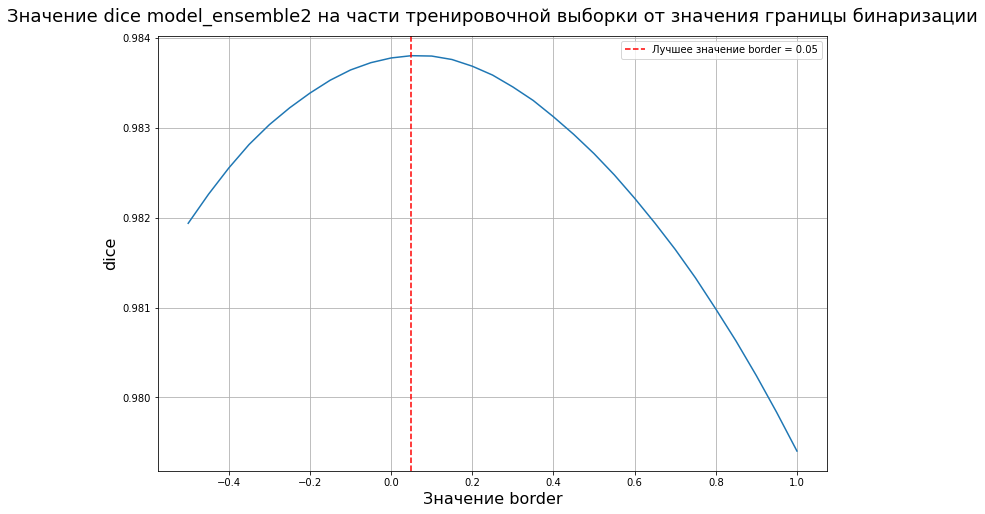

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(binarization_border_grid, train_dices)
plt.axvline(x=best_border, c='r', ls='--', label=f'Лучшее значение border = {best_border}')
plt.title('Значение dice model_ensemble2 на части тренировочной выборки от значения границы бинаризации', fontsize=18, y=1.02)
plt.xlabel('Значение border', fontsize=16)
plt.ylabel('dice', fontsize=16)
plt.grid(visible=True)
plt.legend()
plt.show()

Посмотрим на метрики model_ensemble2, если границу бинаризации делать равной 0.05:

In [ ]:
criterion = nn.BCEWithLogitsLoss().to(device)
print('Метрики на валидационной выборке:')
print(get_metrics(model_ensemble2, criterion, val_batch_gen, border=0.05))
print('Метрики на тренировочной выборке:')
print(get_metrics(model_ensemble2, criterion, train_initial_batch_gen, border=0.05))

Метрики на валидационной выборке:
{'loss': 0.10297643160768624, 'dice': 0.9646602341752294}
Метрики на тренировочной выборке:
{'loss': 0.06180461623596148, 'dice': 0.9832633126482113}


Как видим, val_dice несколько уменьшился: с 0.9661584579277258 до 0.9646602341752294

Тем не менее оставим это значение границы бинаризации 0.05, мы же не хотим специально подстраиваться под валидацию 

### ReflectionAggregator

In [33]:
from post_processing.reflection_aggregator import ReflectionAggregator

Попробуем также применить ReflectionAggregator - будем считать маску не только для исходного изображения, но и отраженного по горизонтали. Затем отраженную маску отражать обратно и усреднять с маской, полученной для исходного изображения. В общем, довольно стандартный трюк.

Вообще здесь можно было бы использовать побольше разных аугментаций, но не хочется сильно усложнять модель, она и так получилась довольно громоздкой.

In [ ]:
reflection_aggregator = ReflectionAggregator(model_ensemble2)

In [ ]:
criterion = nn.BCEWithLogitsLoss().to(device)
print('Метрики reflection_aggregator на валидационной выборке:')
print(get_metrics(reflection_aggregator, criterion, val_batch_gen, border=0.05))
print('Метрики reflection_aggregator на тренировочной выборке:')
print(get_metrics(reflection_aggregator, criterion, train_initial_batch_gen, border=0.05))

Метрики reflection_aggregator на валидационной выборке:
{'loss': 0.10090542364994, 'dice': 0.9661106729725546}
Метрики reflection_aggregator на тренировочной выборке:
{'loss': 0.06096352231139919, 'dice': 0.9836130280313021}


Метрики улучшились, поэтому оставляем эту агрегацию

# Other post-processing ideas:

Посмотрим на несколько масок, предсказанных на валидации чтобы понять, есть ли с ними какие-то проблемы, которые можно пофиксить пост-процессингом, а также чтобы визуально оценить их качество

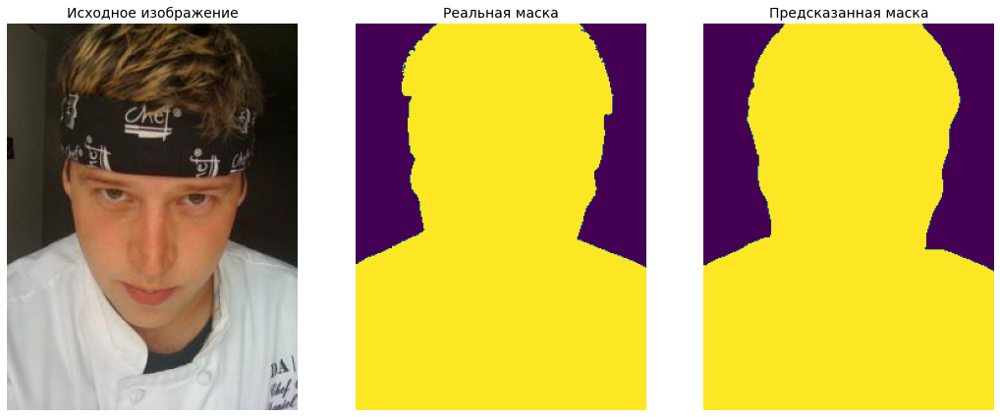

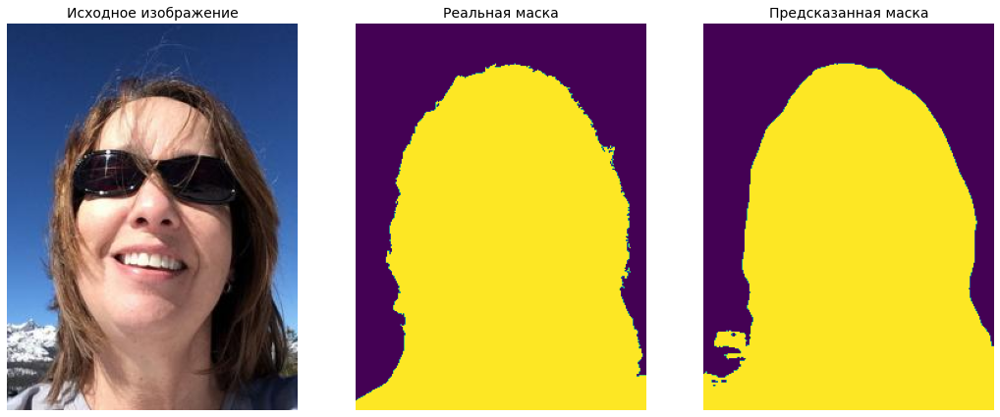

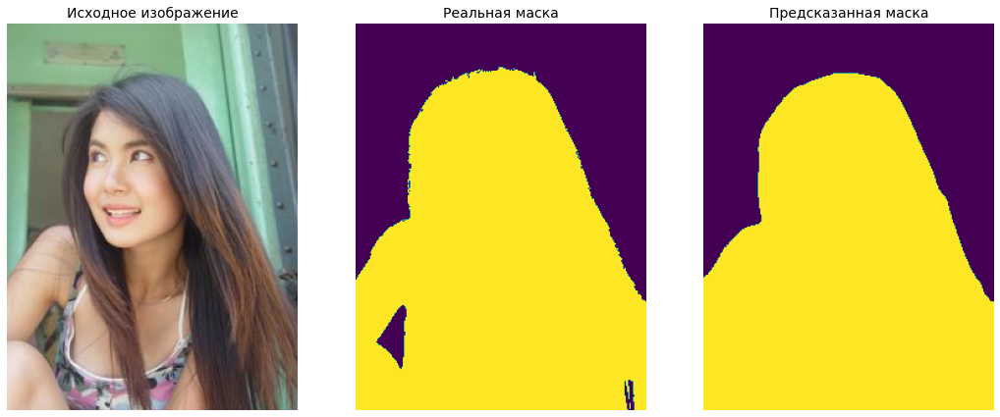

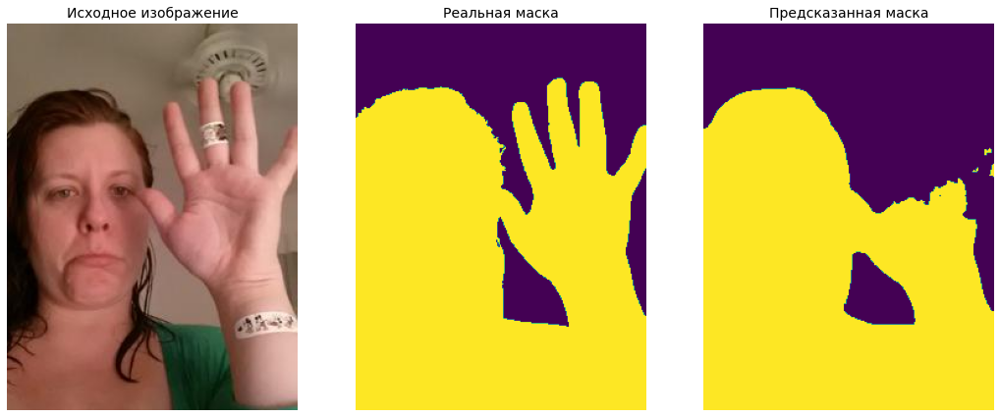

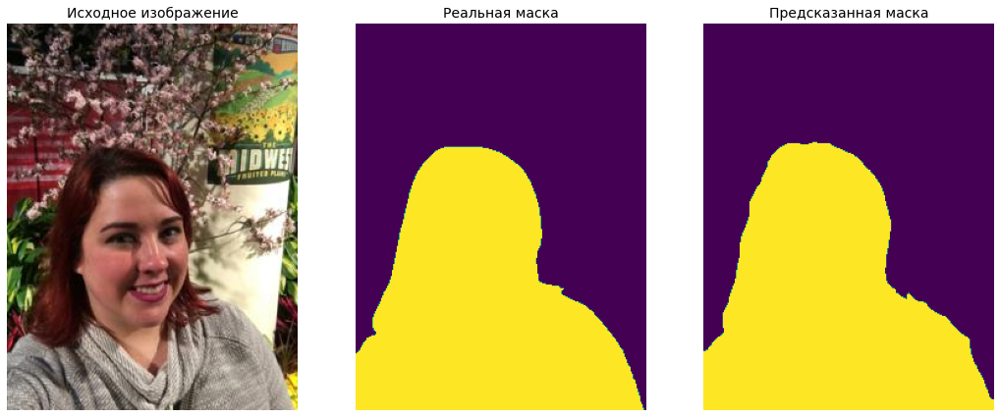

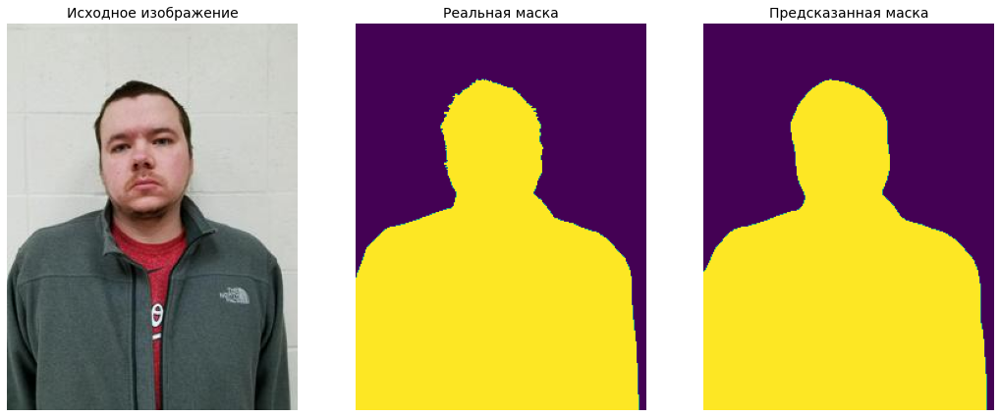

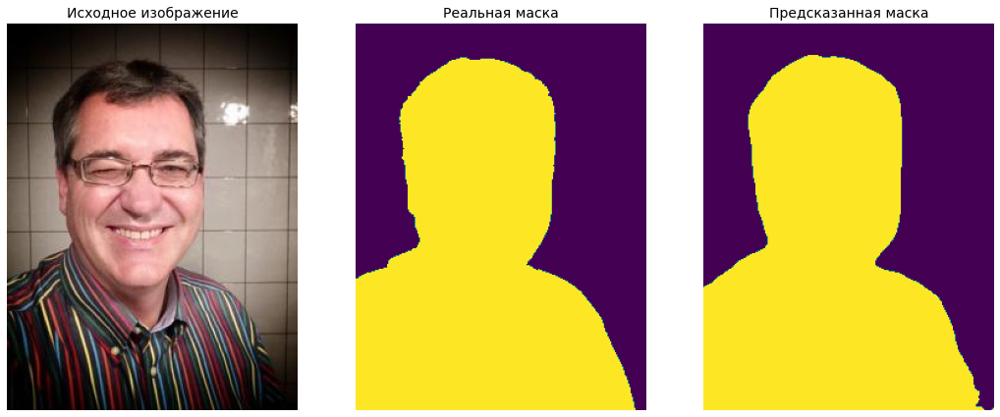

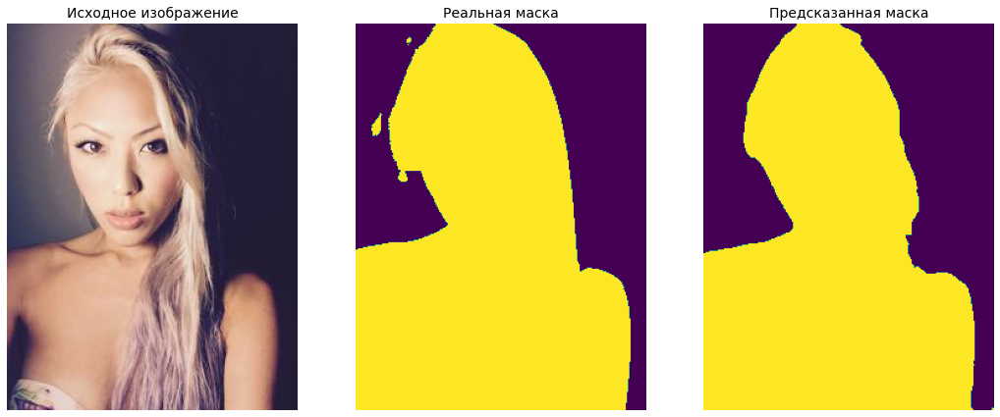

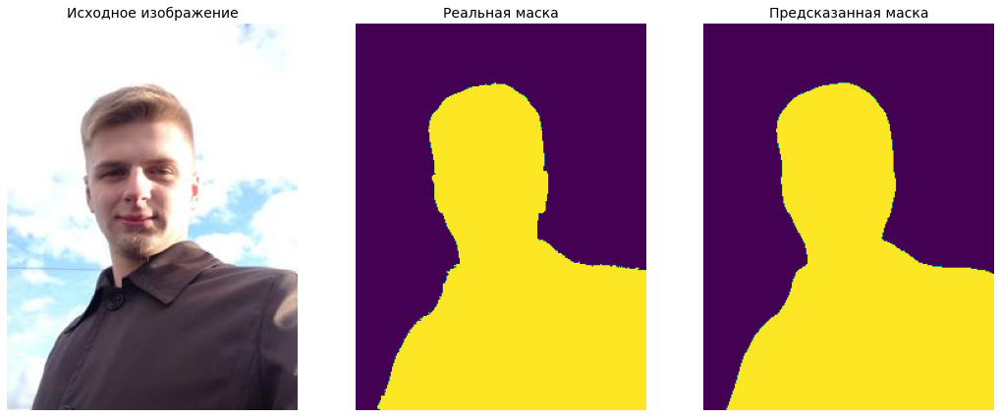

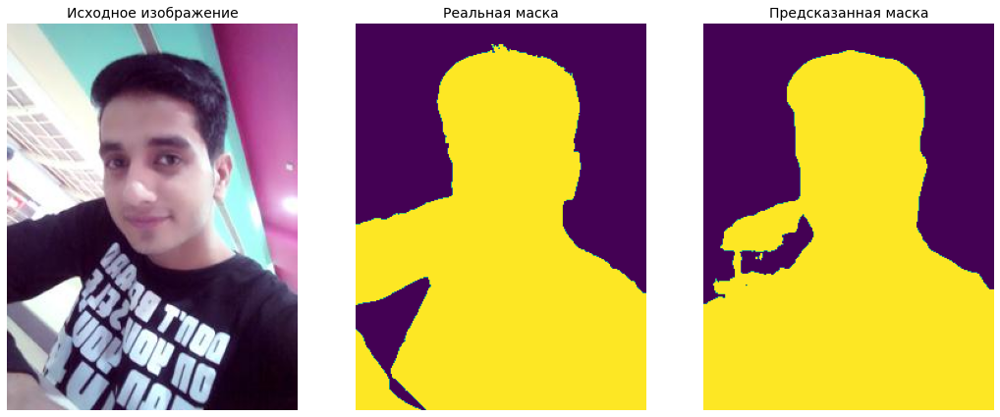

In [ ]:
for filename in sorted(os.listdir(os.path.join(data_path, 'data/valid')))[:10]:
    ind = int(filename.split('.')[0])
    image_path = os.path.join(data_path, 'data/valid', f'{ind}.jpg')
    mask_path = os.path.join(data_path, 'data/valid_mask', f'{ind}.png')
    plot_masks_comparisons(reflection_aggregator, test_transform, [image_path], [mask_path], border=0.05)

В большинстве случаев маски получаются достаточно неплохими. Сейчас в них не так часто встречаются рандомные дыры в центре человека, как это иногда происходило во время обучения.

Если бы дыры были проблемой, можно было бы попробовать обучить ещё одну обертку MaskTuner, которая бы добавляла дополнительные сверточные слои в конце.

Другой возможный вариант решения проблемы - использовать размытие масок, например, например, SoftErosion.

#### MaskTuner

In [34]:
from post_processing.mask_tuner import MaskTuner

### SoftErosion

In [35]:
from post_processing.soft_erosion import SoftErosion, get_smooth_mask

Пример применения SoftErosion:

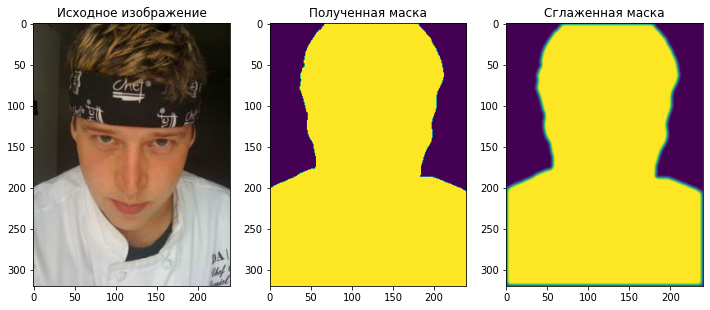

In [ ]:
mask_smoother = SoftErosion(kernel_size=5, threshold=0.9, iterations=7).cuda()

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(12, 5))

image_path = os.path.join(data_path, 'data/valid', '1315.jpg')

image = read_image(image_path)
ax0.imshow(image)
ax0.set_title('Исходное изображение')

mask = (get_mask_prediction(reflection_aggregator, image, test_transform) > 0.05).astype(float)
ax1.imshow(mask)
ax1.set_title('Полученная маска')

smooth_mask = get_smooth_mask(mask, mask_smoother, device)
ax2.imshow(smooth_mask)
ax2.set_title('Сглаженная маска')
plt.show()

На краях картинки из-за паддинга маска получается плохой (там всегда 0), это можно было бы как-то аккуратно пофиксить.

В любом случае, SoftErosion, как и MaskTuner, мы оставляем на уровне идеи. Итоговая модель итак выглядит довольно сложно.

# Final model

**Итак, наша итоговая модель:**

In [81]:
# low resolution VanillaUNet, SDUNet, LinkNet, HRUNet
low_res_model_run_ids = ['24tso77h', '1qx29ajc', '1a2djffv', '9q2vzhda']
low_res_models = [load_model(run_id, weights_dir, device) for run_id in low_res_model_run_ids]

# ResizeAggregator, чтобы модели работали на том же разрешении, на котором обучались
low_res_model_aggregators = [ResizeAggregator(low_res_model, [smaller_size]) for low_res_model in low_res_models]

model_ensemble2 = LinearCombinationEnsemble(
    low_res_model_aggregators
)

reflection_aggregator = ReflectionAggregator(model_ensemble2).to(device)

best_border = 0.05  # граница для бинаризации масок

Еще раз на всякий случай считаем метрики, проверяем, что ничего не перепутали.

In [37]:
criterion = nn.BCEWithLogitsLoss().to(device)
print('Метрики reflection_aggregator на валидационной выборке:')
print(get_metrics(reflection_aggregator, criterion, val_batch_gen, border=0.05))
print('Метрики reflection_aggregator на тренировочной выборке:')
print(get_metrics(reflection_aggregator, criterion, train_initial_batch_gen, border=0.05))

Метрики reflection_aggregator на валидационной выборке:
{'loss': 0.10090542364994, 'dice': 0.9661106729725546}
Метрики reflection_aggregator на тренировочной выборке:
{'loss': 0.06096352253803282, 'dice': 0.9836130280313021}


Метрики такие же, какие мы получали в предыдущем блоке, все ок

### Testing with new images

Посмотрим, как модель справится с картинками не из датасета.

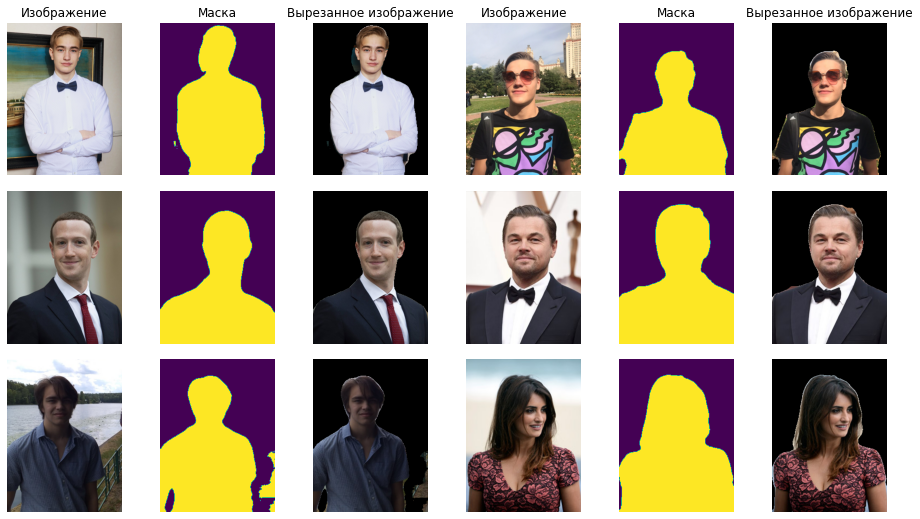

In [70]:
test_dir = '/content/drive/MyDrive/MILTestTasks/test_images'
filenames = sorted(os.listdir(test_dir))
fig, axes = plt.subplots(len(filenames) // 2, 6, figsize=(16, 1.5 * len(filenames)))

for i, filename in enumerate(filenames):
    for ax in axes[i // 2]:
        ax.axis('off')

    ax0, ax1, ax2 = axes[i // 2][(i % 2) * 3: (i % 2) * 3 + 3]

    image_path = os.path.join(test_dir, filename)
    image = read_image(image_path)
    ax0.imshow(image)

    mask = (get_mask_prediction(reflection_aggregator, image, test_transform) > 0.05).astype(float)
    ax1.imshow(mask)

    image[mask == 0] = 0
    ax2.imshow(image)

    if i // 2 == 0:
        ax0.set_title('Изображение')
        ax1.set_title('Маска')
        ax2.set_title('Вырезанное изображение')

plt.subplots_adjust(wspace=None, hspace=0.1)
fig.savefig('/content/example.png')
plt.show()

На этих примерах модель отработала довольно неплохо

In [71]:
from google.colab import files
files.download('/content/example.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Final Results

### Создаем предсказания для валидационной выборки

In [82]:
from lib.utils import encode_rle, decode_rle

In [83]:
pred = pd.read_csv(os.path.join(data_path, 'data/pred_valid_template.csv'))
pred.head(3)

,id,rle_mask
0,1315,9706 7 9939 15 9974 8 10174 20 10214 13 10412 ...
1,1316,9706 7 9939 15 9974 8 10174 20 10214 13 10412 ...
2,1317,9706 7 9939 15 9974 8 10174 20 10214 13 10412 ...


In [84]:
!rm -rf test_results

paths_to_imgs = sorted(glob('MIL_task_data/data/valid/*'))

valid_preds = []

for image_path in tqdm(paths_to_imgs):
    # правильнее это регуляркой сделать конечно
    image_id = int(image_path.split('/')[-1].split('.')[0])
    image = read_image(image_path)
    mask = get_mask_prediction(reflection_aggregator, image, test_transform)
    mask = (mask > best_border).astype(np.uint8) * 255
    assert(mask.shape == (image_height, image_width))
    rle_mask = encode_rle(mask)
    valid_preds.append({'id': image_id, 'rle_mask': rle_mask})

100%|██████████| 145/145 [00:37<00:00,  3.89it/s]


In [85]:
my_pred = pd.DataFrame(valid_preds)

In [86]:
my_pred.head(3)

,id,rle_mask
0,1315,68 114 307 115 547 116 786 117 1025 119 1264 1...
1,1316,8029 2 8032 14 8265 27 8502 32 8738 38 8975 50...
2,1317,9948 21 10186 28 10422 37 10659 45 10896 51 11...


In [87]:
assert(len(my_pred) == len(pred) and (my_pred.columns == pred.columns).all())

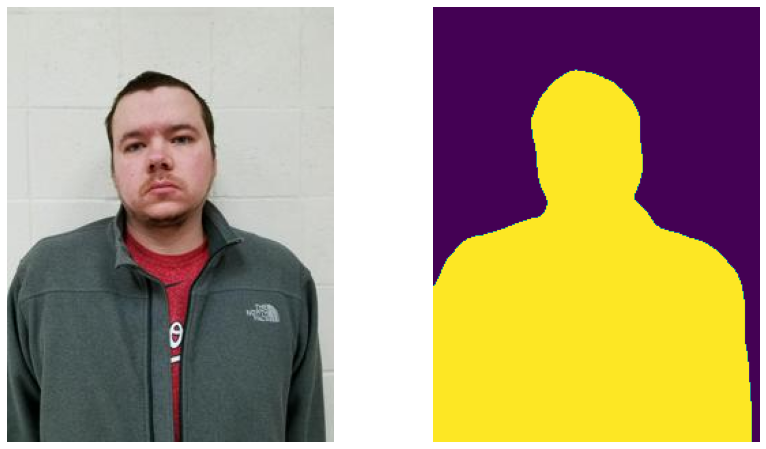

(320, 240, 3) (320, 240)


In [89]:
# Проверяем
index = 1320
image = read_image(os.path.join(data_path, f'data/valid/{index}.jpg'))
rle_mask = my_pred[my_pred['id'] == index]['rle_mask'].iloc[0]
decoded_mask = decode_rle(rle_mask)
show_img_with_mask(image, decoded_mask)

print(image.shape, decoded_mask.shape)

In [ ]:
from google.colab import files

csv_path = 'valid_preds.csv'
my_pred.to_csv(csv_path)
files.download(csv_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Создаем html страницу для данных из test

In [90]:
from lib.html import get_html

Пример для валидации:

In [91]:
paths_to_imgs = sorted(glob('MIL_task_data/data/valid/*'))
pred_masks = [np.array(Image.open(path)) for path in sorted(glob('MIL_task_data/data/valid_mask/*'))]
_ = get_html(paths_to_imgs, pred_masks, path_to_save="valid_results/example")

In [92]:
print(type(pred_masks[0]), pred_masks[0].shape, pred_masks[0].dtype, pred_masks[0].min(), pred_masks[0].max())

<class 'numpy.ndarray'> (320, 240) uint8 0 255


In [93]:
!ls valid_results

example  example.html


In [ ]:
from google.colab import files
valid_zip_path = '/content/valid_results.zip'
!rm $valid_zip_path
!zip -qq -r $valid_zip_path valid_results
files.download(valid_zip_path)

Тест:

In [95]:
!rm -rf test_results

paths_to_imgs = sorted(glob('MIL_task_data/data/test/*'))

masks = []

for image_path in tqdm(paths_to_imgs):
    image = read_image(image_path)
    mask = get_mask_prediction(reflection_aggregator, image, test_transform)
    mask = (mask > best_border).astype(np.uint8) * 255
    assert(mask.shape == (image_height, image_width))
    masks.append(mask)

_ = get_html(paths_to_imgs, masks, path_to_save='test_results/final')

100%|██████████| 100/100 [00:24<00:00,  4.01it/s]


In [ ]:
from google.colab import files
test_zip_path = '/content/test_results.zip'
!rm $test_zip_path
!zip -qq -r $test_zip_path test_results
files.download(test_zip_path)